# Experiment with different Models

-----

### Objective
The goal of this notebook is to explore and experiment with various models to establish benchmarks and identify the models that best fit the dataset.




### Summary:
0) **Set up the environment**: load the necessary libraries and configure resources.
1) **Data Access**: prepare and load the dataset for model experimentation.     
2) **Experiment with different Models**: test a variety of machine learning models to evaluate their performance.
3) **Select the best performing Model**: identify the model that achieves the best results based on predefined evaluation metrics.
4) **Present variations and new results with the selected Model**: analyze and present results from variations and improvements made to the selected model.
   

-----

## Set up the environment

### Import Libs

In [75]:
import torch
import torch.nn as nn
import torch.utils.data as data
import torch.nn.functional as F
import torchvision.transforms.functional as TF

import matplotlib.pyplot as plt
import os
import numpy as np
from glob import glob
import glob
import random
#import imageio
import imageio.v2 as imageio  # Explicitly use version 2 API
from torchvision import transforms
from collections import defaultdict

import segmentation_models_pytorch as smp
from segmentation_models_pytorch.losses import DiceLoss
from torchmetrics import JaccardIndex

from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import jaccard_score
from PIL import Image

from transformers import get_cosine_schedule_with_warmup
from torch.optim.lr_scheduler import ReduceLROnPlateau

import re
import shutil

import importlib
import S7_tools

In [9]:
# Set the Multiprocessing Start Method for Windows
import torch.multiprocessing as mp

if __name__ == "__main__":
    mp.set_start_method('spawn', force=True)

# Set a known seed
seed = 23
torch.manual_seed(seed)
random.seed(seed)
np.random.seed(seed)


### CUDA configuration

In [11]:
print(70*'-')
print("CUDA available:", torch.cuda.is_available())
current_device = torch.cuda.current_device()
print("GPU Model:", torch.cuda.get_device_name(current_device))
print("CUDA Version:", torch.version.cuda)
print(70*'-')

device_properties = torch.cuda.get_device_properties(current_device)
print("\nDevice Properties:")
print("  Name:", device_properties.name)
print("  Total Memory (GB):", device_properties.total_memory / (1024 ** 3))  # Convert bytes to GB
print("  Multiprocessors:", device_properties.multi_processor_count)
print("  Compute Capability:", device_properties.major, ".", device_properties.minor)
print(70*'-')

----------------------------------------------------------------------
CUDA available: True
GPU Model: NVIDIA GeForce GTX 1080 Ti
CUDA Version: 11.8
----------------------------------------------------------------------

Device Properties:
  Name: NVIDIA GeForce GTX 1080 Ti
  Total Memory (GB): 10.999755859375
  Multiprocessors: 28
  Compute Capability: 6 . 1
----------------------------------------------------------------------


## 1- Data Access

### Import Dataset
- Import folder with images
- Import folder with masks
- Create list with training, validation and testing data

In [14]:
# Function to extract the numeric value from filenames
def numeric_sort_key(filepath):
    # Extract numbers from the filename using a regular expression
    match = re.search(r'\d+', filepath)
    # Return the integer value of the number if found, otherwise 0
    return int(match.group()) if match else 0

# Get all the image and mask paths and sort them numerically
folder_data_train = sorted(
    glob.glob("../5-Data_Wrangling/data_split2/train/input/*tif"),
    key=numeric_sort_key
)
folder_mask_train = sorted(
    glob.glob("../5-Data_Wrangling/data_split2/train/labels/*tif"),
    key=numeric_sort_key
)

folder_data_val = sorted(
    glob.glob("../5-Data_Wrangling/data_split2/val/input/*tif"),
    key=numeric_sort_key
)
folder_mask_val = sorted(
    glob.glob("../5-Data_Wrangling/data_split2/val/labels/*tif"),
    key=numeric_sort_key
)

folder_data_test = sorted(
    glob.glob("../5-Data_Wrangling/data_split2/test/input/*tif"),
    key=numeric_sort_key
)
folder_mask_test = sorted(
    glob.glob("../5-Data_Wrangling/data_split2/test/labels/*tif"),
    key=numeric_sort_key
)

# Assign to variables
train_image_paths = folder_data_train[:]
val_image_paths = folder_data_val[:]
test_image_paths = folder_data_test[:]

train_mask_paths = folder_mask_train[:]
val_mask_paths = folder_mask_val[:]
test_mask_paths = folder_mask_test[:]


In [15]:
# Check the number of train, val and test images
print('\nControl number of images by folder:')
print(40*'=')
input_total = len(folder_data_train)+len(folder_data_val)+len(folder_data_test)
labels_total = len(folder_mask_train)+len(folder_mask_val)+len(folder_mask_test)
print('\t\tinput: \tlabels:')
print(f'Train\t\t{len(folder_data_train)}\t{len(folder_mask_train)}\t{(len(folder_data_train)/input_total)*100:.2f}%')
print(f'Val\t\t{len(folder_data_val)}\t{len(folder_mask_val)}\t{(len(folder_data_val)/input_total)*100:.2f}%')
print(f'Test\t\t{len(folder_data_test)}\t{len(folder_mask_test)}\t{(len(folder_data_test)/input_total)*100:.2f}%')
print(40*'=')
print(f'Total\t\t{input_total}\t{labels_total}')


Control number of images by folder:
		input: 	labels:
Train		201	201	73.90%
Val		35	35	12.87%
Test		36	36	13.24%
Total		272	272


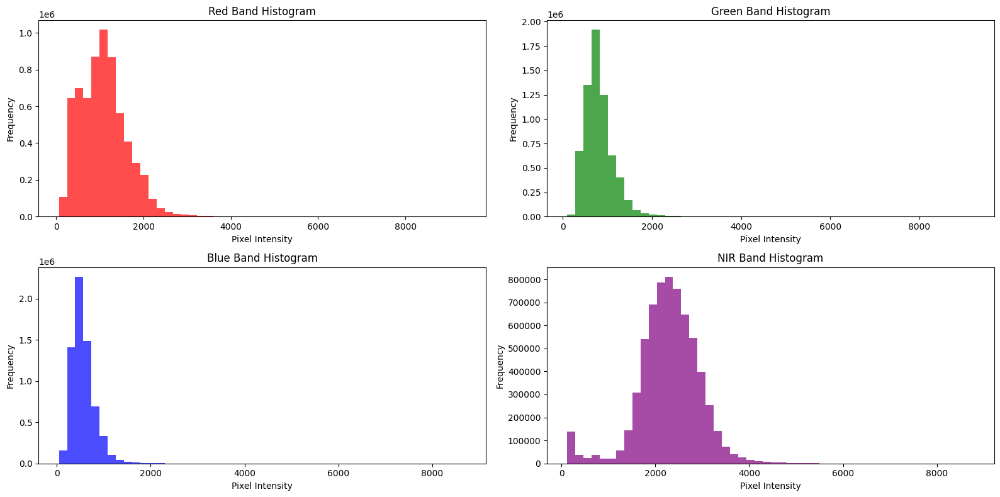

In [21]:
def plot_histograms(image_paths, num_samples=5):
    """
    Plot histograms for each band (R, G, B, NIR) for a given sample of images.
    """
    red_values = []
    green_values = []
    blue_values = []
    nir_values = []
    
    # Iterate over a subset of images
    for img_path in image_paths[:num_samples]:  
        image = imageio.imread(img_path)
        
        # Separate the bands
        red_values.extend(image[:, :, 0].flatten())
        green_values.extend(image[:, :, 1].flatten())
        blue_values.extend(image[:, :, 2].flatten())
        nir_values.extend(image[:, :, 3].flatten())
    
    # Plot histograms
    plt.figure(figsize=(16, 8))
    
    plt.subplot(2, 2, 1)
    plt.hist(red_values, bins=50, color='red', alpha=0.7)
    plt.title("Red Band Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    
    plt.subplot(2, 2, 2)
    plt.hist(green_values, bins=50, color='green', alpha=0.7)
    plt.title("Green Band Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    
    plt.subplot(2, 2, 3)
    plt.hist(blue_values, bins=50, color='blue', alpha=0.7)
    plt.title("Blue Band Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    
    plt.subplot(2, 2, 4)
    plt.hist(nir_values, bins=50, color='purple', alpha=0.7)
    plt.title("NIR Band Histogram")
    plt.xlabel("Pixel Intensity")
    plt.ylabel("Frequency")
    
    plt.tight_layout()
    plt.show()

# Call the function with your training image paths
plot_histograms(train_image_paths, num_samples=100)

In [21]:
def calculate_class_balance_from_paths(mask_paths):
    """
    Calculate the class balance (proportion of positive and negative pixels) for a dataset using mask file paths.
    """
    total_pixels = 0
    positive_pixels = 0

    for mask_path in mask_paths:
        mask = imageio.imread(mask_path).astype(np.float32)
        mask = np.where(mask > 0.5, 1, 0)
        
        total_pixels += mask.size
        positive_pixels += mask.sum()

    negative_pixels = total_pixels - positive_pixels

    # Calculate proportions
    positive_ratio = positive_pixels / total_pixels
    negative_ratio = negative_pixels / total_pixels

    class_balance = {
        "positive_ratio": positive_ratio,
        "negative_ratio": negative_ratio,
        "total_pixels": total_pixels,
    }

    return class_balance

    

In [23]:
# Calculate the training, validation, and test sets class balance
train_balance = calculate_class_balance_from_paths(train_mask_paths)
val_balance = calculate_class_balance_from_paths(val_mask_paths)
test_balance = calculate_class_balance_from_paths(test_mask_paths)

print("Class Balance in Training Set:", train_balance)
print("Class Balance in Validation Set:", val_balance)
print("Class Balance in Test Set:", test_balance)

Class Balance in Training Set: {'positive_ratio': 0.023000536866449005, 'negative_ratio': 0.976999463133551, 'total_pixels': 13172736}
Class Balance in Validation Set: {'positive_ratio': 0.08281337193080357, 'negative_ratio': 0.9171866280691964, 'total_pixels': 2293760}
Class Balance in Test Set: {'positive_ratio': 0.07199266221788195, 'negative_ratio': 0.9280073377821181, 'total_pixels': 2359296}


The dataset exhibits a significant class imbalance across all subsets (training, validation, and test):
- Training Set: The positive class (target) constitutes only ~2.3% of the total pixels, while the negative class accounts for ~97.7%.
- Validation Set: The positive class is slightly better represented at ~8.3%, but the negative class still dominates at ~91.7%.
- Test Set: Similar to the validation set, the positive class represents ~7.2%, with the negative class comprising ~92.8%.

This imbalance is typical for semantic segmentation problems where the positive class often corresponds to specific objects or regions of interest (e.g., photovoltaic panels) within larger background areas. While expected, this imbalance poses challenges for model training and evaluation. Standard metrics like accuracy may be misleading, as they can be biased towards the dominant negative class.

To address these challenges, the use of alternative metrics such as F1-Score and Jaccard Index (IoU - Intersection Over Union) will be explored. Additionally, employing well-balanced loss functions designed to detect the nuances of the positive class, such as Focal Loss, will be crucial in achieving meaningful segmentation results.

### Custom Dataset

In this step of the project, we have chosen to use PyTorch, one of the popular frameworks for Machine Learning. As part of this, we will begin by defining a `CustomDataset` class, which inherits from PyTorch's `torch.utils.data.Dataset`. This class will handle the specific nuances and requirements of our dataset, ensuring it is ready for model training and evaluation.

In [28]:
from torch.utils.data import get_worker_info

class CustomDataset(data.Dataset):
    def __init__(self, image_paths, target_paths, transform=None, band=None):

        self.image_paths = image_paths
        self.target_paths = target_paths
        self.transform = transform
        self.band = band # Specify which band to use (0: R, 1: G, 2: B, 3: NIR, None: all bands)
        self.scaler = MinMaxScaler() 
                
    def __getitem__(self, index):
         
        # Debugging: Get worker information
        worker_info = get_worker_info()
        if worker_info:
            print(f"Worker {worker_info.id} is processing index {index}")

        try:
            image = imageio.imread(self.image_paths[index]).astype(np.float32)
    
            # Select a specific band if specified
            if self.band is not None:
                image = image[:, :, self.band] #Select only the specified band
                image = image[:, :, np.newaxis]
                
            # Normalize the image
            image_reshaped = image.reshape(-1, image.shape[-1])
            image_scaled = self.scaler.fit_transform(image_reshaped)
            image = image_scaled.reshape(image.shape)
    
            # Reshape for MinMaxScaler and apply normalization
            image_reshaped = image.reshape(-1, 4)
            image_scaled = self.scaler.fit_transform(image_reshaped)
            image = image_scaled.reshape(image.shape)
            
            # Load the 1-band binary mask
            mask = imageio.imread(self.target_paths[index])
            mask = np.asarray(mask, dtype='float32')
            mask = np.where(mask>1, 0, mask) # some images has soil annotations as well
    
            # Debugging: Print shapes and types
            #print(f"Image shape: {image.shape}, dtype: {image.dtype}")
            #print(f"Mask shape: {mask.shape}, dtype: {mask.dtype}")
    
            # Apply the transformation to both image and mask if self.transform is set
            if self.transform:
                image, mask = self.transform(image, mask)  # Pass both to transform if synchronized
    
            return image, mask
            
        except Exception as e:
            print(f"Error loading data at index {index} in worker {worker_info.id if worker_info else 'main process'}: {e}")
            raise e


    def __len__(self):

        return len(self.image_paths)

class ToTensor:
    def __call__(self, image, mask):
        image = torch.tensor(image, dtype=torch.float32).permute(2, 0, 1)  # Convert image to [C, H, W]
        mask = torch.tensor(mask, dtype=torch.float32).unsqueeze(0)  # Add channel dimension for mask
        return image, mask


In [30]:
# Initialize the CustomDataset objects
use_all_bands = True
model_band = None # 0:red, 1:green, 2:blue, 3:NIR, None:all 4 bands

train_dataset = CustomDataset(train_image_paths, train_mask_paths, transform=ToTensor(), band=model_band)
val_dataset = CustomDataset(val_image_paths, val_mask_paths, transform=ToTensor(), band=model_band)
test_dataset = CustomDataset(test_image_paths, test_mask_paths, transform=ToTensor(), band=model_band)

image, mask = train_dataset[0]  # Load the first item
print(f"Transformed image shape: {image.shape}, dtype: {image.dtype}")
print(f"Transformed mask shape: {mask.shape}, dtype: {mask.dtype}")

Transformed image shape: torch.Size([4, 256, 256]), dtype: torch.float32
Transformed mask shape: torch.Size([1, 256, 256]), dtype: torch.float32


### Visualize the synchronization of input images and masks

In [33]:
def visualize_augmentations(dataset, num_samples=3):
    for i in range(num_samples):
        image, mask = dataset[i]
        
        # Display input image and mask side-by-side
        plt.figure(figsize=(10, 5))
        
        plt.subplot(1, 2, 1)
        plt.imshow(image.permute(1, 2, 0))  # Convert CHW to HWC for display
        plt.title("Input Image")
        
        plt.subplot(1, 2, 2)
        plt.imshow(mask[0], cmap='gray')  # Show mask in grayscale
        plt.title("Target Mask")
        
        plt.show()

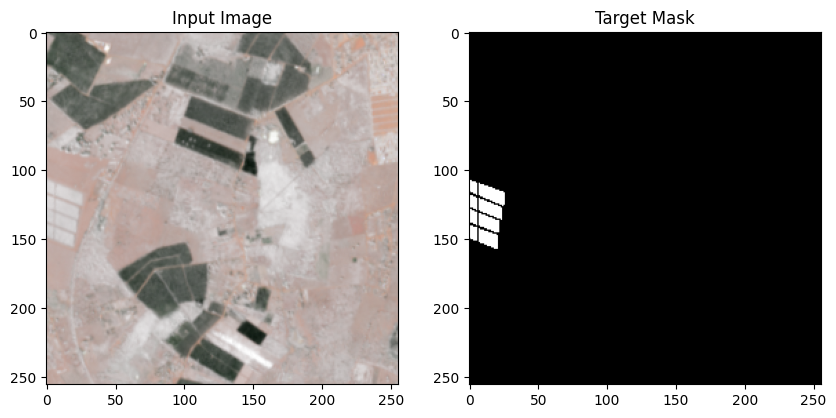

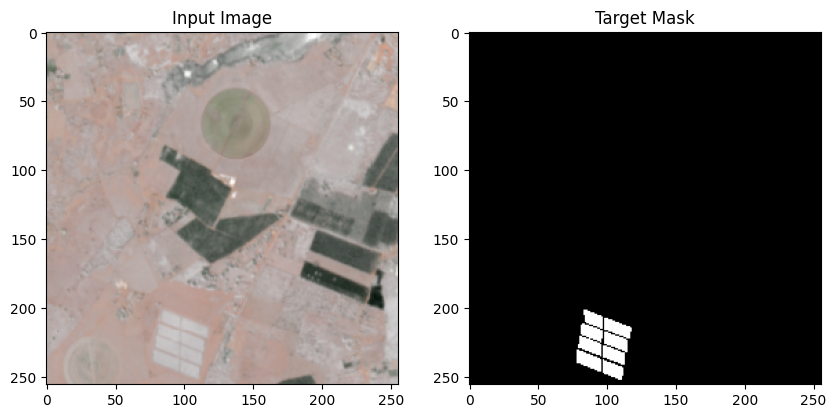

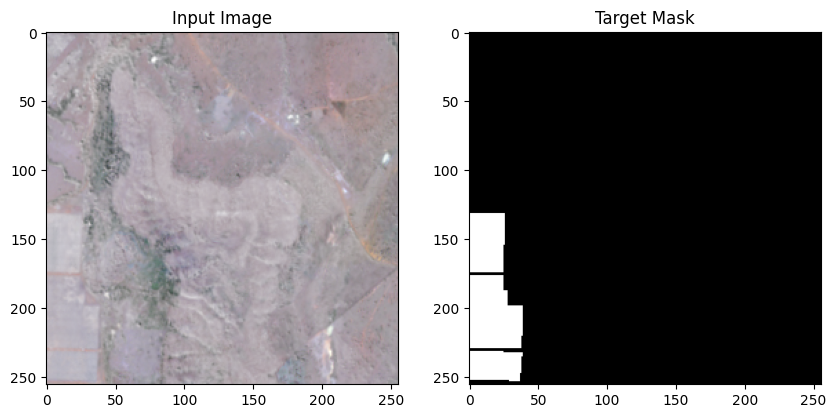

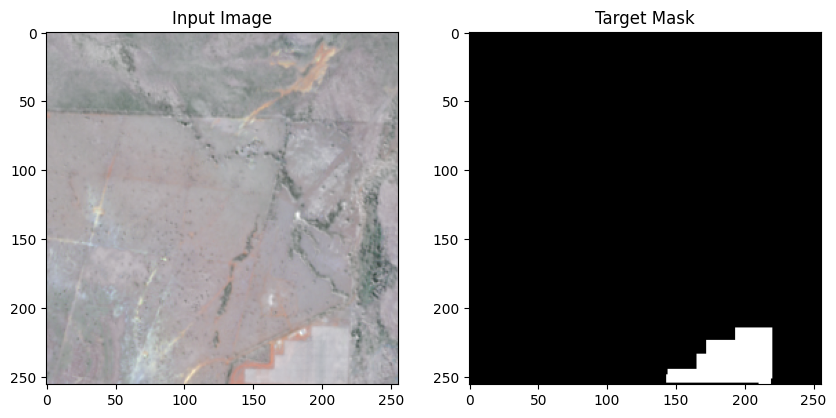

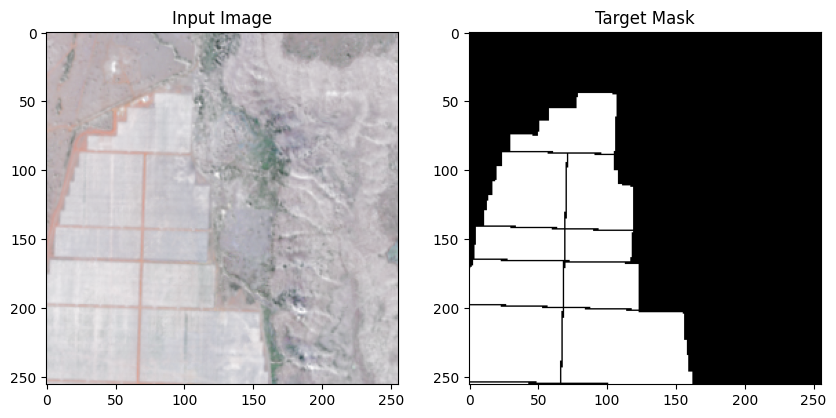

...

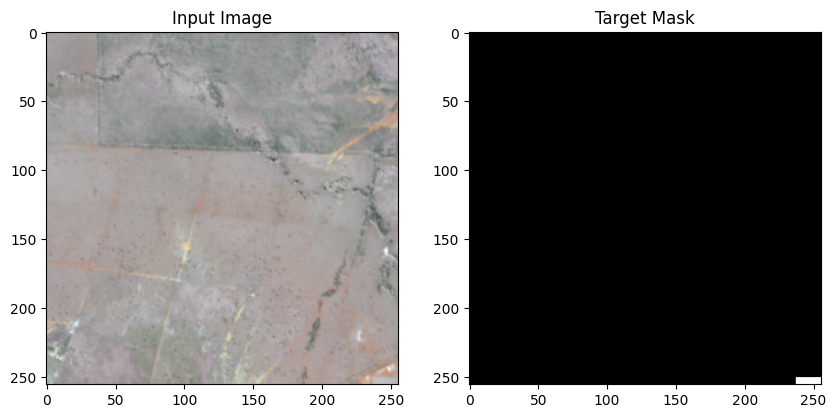

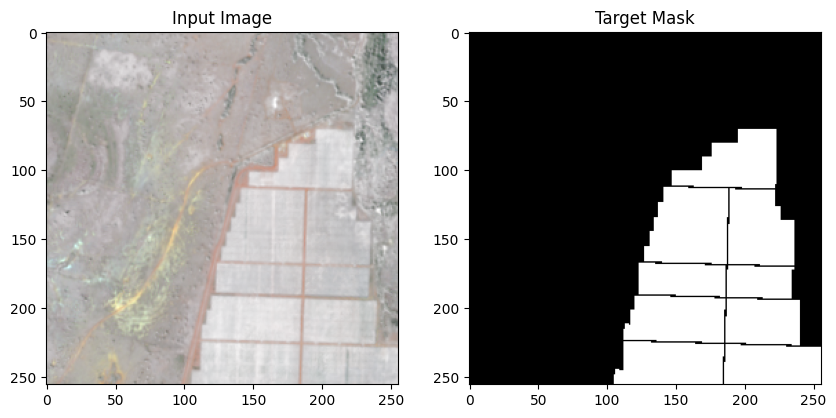

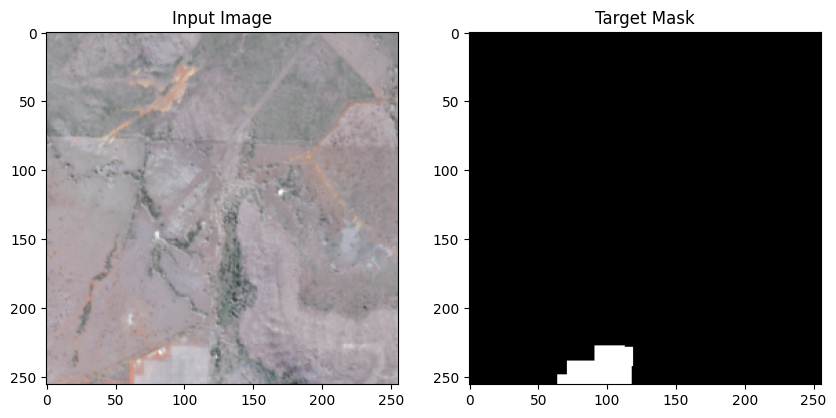

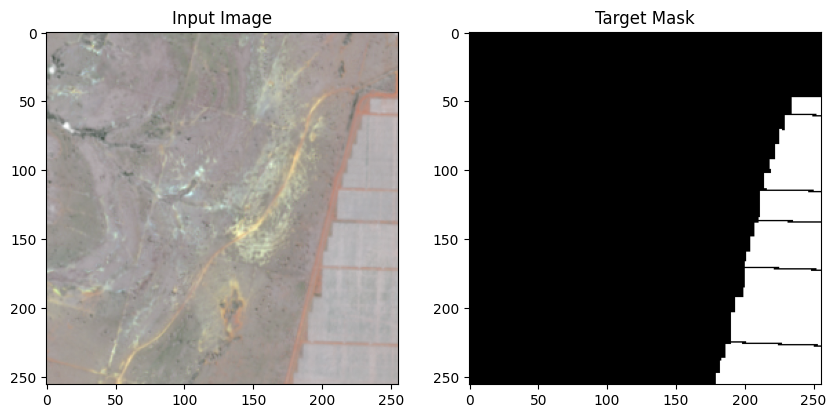

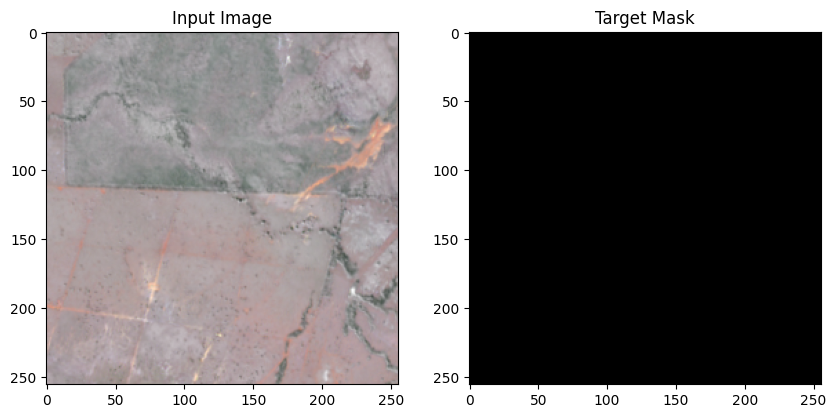

In [35]:
visualize_augmentations(test_dataset, num_samples=15)

## 2- Experiment with different Models

### First Model: **U-Net**

In [38]:
ENCODER = 'efficientnet-b7'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['solar_panel']
ACTIVATION = 'sigmoid'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

model = smp.Unet(
#model = smp.DeepLabV3Plus(
#model = smp.UnetPlusPlus(
    in_channels = 4 if use_all_bands else 1, #4 for all bands
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
    #decoder_atrous_rates = (6, 12, 24) # for DeepLabv3+
    #decoder_dropout=0.3
       
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

In this section, we define our semantic segmentation model using the `segmentation_models_pytorch` (SMP) library. First, we selected the **U-Net** architecture for its balance between simplicity and effectiveness in semantic segmentation tasks (paper: https://arxiv.org/pdf/1505.04597). The encoder backbone is set to **EfficientNet-b7**, a state-of-the-art feature extractor known for its high accuracy and computational efficiency. To leverage pre-trained knowledge, we initialize the encoder with **ImageNet** weights.

The model is configured with:
- Input Channels: Dynamically set to 4 (e.g., RGB + NIR)
- Classes: A single target class (solar_panel) for binary segmentation.
- Activation: Sigmoid activation in the output layer to predict probabilities for the binary mask.

To ensure that the input data matches the encoder's expected format, we utilize a preprocessing function provided by the SMP library. This function applies normalization and scaling consistent with the encoder's pre-training on ImageNet.

The chosen U-Net architecture and preprocessing pipeline offer a solid foundation for experimentation, allowing flexibility to switch between different backbones and model configurations as needed. By using transfer learning, the model can converge faster and achieve better performance on the relatively small dataset.

### Loss & Optimizer

In [41]:
class WeightedBCELoss(nn.Module):
    def __init__(self, pos_weight=1.0, neg_weight=1.0):
        super(WeightedBCELoss, self).__init__()
        self.pos_weight = pos_weight  # Weight for positive class
        self.neg_weight = neg_weight  # Weight for negative class

    def forward(self, inputs, targets):
        # print(f"weights: pos {self.pos_weight} neg {self.neg_weight}") # debugging
        # Weighted BCE computation
        loss = -self.pos_weight * targets * torch.log(inputs + 1e-7) - \
               self.neg_weight * (1 - targets) * torch.log(1 - inputs + 1e-7)
        return loss.mean()
        

class BCEFocalNegativeIoULoss(nn.Module):
    def __init__(self, alpha=0.8, gamma=1.5, pos_weight=2.0, neg_weight=1.0):
        """
        Args:
            alpha: Weight for Focal Loss.
            gamma: Modulating factor for Focal Loss.
            pos_weight: Weight for positive class in BCE Loss.
            neg_weight: Weight for negative class in BCE Loss.
        """
        super(BCEFocalNegativeIoULoss, self).__init__()
        self.bce = WeightedBCELoss(pos_weight=pos_weight, neg_weight=neg_weight)
        self.alpha = alpha
        self.gamma = gamma

    def focal_loss(self, inputs, targets):
        BCE_loss = -targets * torch.log(inputs + 1e-7) - (1 - targets) * torch.log(1 - inputs + 1e-7)
        #pt = torch.exp(-BCE_loss)  # Probability of the true class
        pt = inputs * targets + (1 - inputs) * (1 - targets)
        F_loss = self.alpha * (1 - pt) ** self.gamma * BCE_loss
        return F_loss.mean()

    def forward(self, inputs, targets):
        if targets.sum() == 0:  # Skip blank masks
            return torch.tensor(0.0, requires_grad=True).to(inputs.device)

        # Core loss components
        bce_loss = self.bce(inputs, targets)
        focal_loss = self.focal_loss(inputs, targets)

        # Compute IoU for positive and negative classes
        #preds = inputs.sigmoid()  # Apply sigmoid activation
        preds = inputs
        #preds = model(inputs)  # No need to apply sigmoid again if already applied in the model
        iou_positive, mean_iou = compute_class_aware_iou(preds, targets)

        # Jaccard Loss for Positive and Negative IoU
        jaccard_loss_positive = 1.0 - iou_positive  # Positive IoU
        jaccard_loss_negative = 1.0 - (2 * mean_iou - iou_positive)  # Derive Negative IoU

        # Weighted Jaccard Loss
        jaccard_loss = 0.85 * jaccard_loss_positive + 0.15 * jaccard_loss_negative

        # Combine all losses
        total_loss = 0.3 * bce_loss + 0.3 * focal_loss + 0.4 * jaccard_loss
        return total_loss


def compute_class_aware_iou(preds, masks, threshold=0.5):
    """
    Compute IoU for positive and negative classes with a dynamic threshold.
    """
    # Apply threshold to predictions
    preds = (preds > threshold).int()
    masks = masks.int()

    preds_np = preds.cpu().numpy().reshape(-1)
    masks_np = masks.cpu().numpy().reshape(-1)

    # Compute IoU for positive and negative classes
    iou_positive = jaccard_score(masks_np, preds_np, pos_label=1)
    iou_negative = jaccard_score(masks_np, preds_np, pos_label=0)

    # Mean IoU
    mean_iou = (iou_positive + iou_negative) / 2
    return iou_positive, mean_iou

After exploring multiple options and variations, this code defines a custom Loss function and optimization pipeline tailored for semantic segmentation tasks with class imbalance. 
The ad-hoc class `BCEFocalNegativeIoULoss` combines three components: 

- a **weighted binary cross-entropy (BCE)** loss to emphasize the minority class using class-specific weights.
- a **Focal Loss** to address hard-to-classify samples by modulating loss contributions based on prediction confidence.
- a **class-aware IoU (Jaccard) loss** to penalize segmentation errors, particularly along boundaries, by separately calculating contributions for positive and negative classes.
 
This combination ensures the loss function is robust in handling imbalanced datasets while focusing on precise delineation of target regions.



In [44]:
loss = BCEFocalNegativeIoULoss(alpha=0.8, gamma=2)

optimizer = torch.optim.AdamW(
    model.parameters(), 
    lr=0.0001,               
    weight_decay=1e-6        
    )

# Initialize the Global Threshold to predict sigmoid inputs
g_threshold = 0.5

# Adjusts every 'step_size' epochs, decreasing by 'gamma'*100 %
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)


The optimizer is configured with **AdamW**, then Adam optimizer version which includes weight decay for regularization.

The learning rate is dynamically adjusted using the **ReduceLROnPlateau** scheduler, which reduces the learning rate when validation performance plateaus. This combination ensures robust training, particularly in challenging datasets with imbalanced classes and high variability in feature representation. Additionally, a global threshold (g_threshold) of 0.5 is used to interpret the model's probabilistic outputs for binary segmentation predictions (used later on). 

This setup balances precision, recall, and IoU to optimize segmentation accuracy effectively.

In [49]:
# Replace DataLoader setup for training, validation, and testing
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=0)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=False, num_workers=0)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=40, shuffle=False, num_workers=0)

This code defines data loaders with specific batch sizes to balance computational efficiency and memory constraints during training and evaluation.

The `train_loader` uses a smaller batch size of 5, suitable for iterative updates and accommodating limited GPU memory during training. For validation and testing, larger batch sizes of 40 and 30, respectively, are used to improve processing efficiency when model updates are not required. However, increasing batch sizes further is constrained by the available GPU memory, which limits the number of samples that can be processed simultaneously. 
These settings reflect a balance between performance and hardware limitations.

In [52]:
from torch.amp import autocast, GradScaler

# Initialize AMP GradScaler
scaler = GradScaler('cuda')

# Define training loop function
def train_one_epoch(model, dataloader, optimizer, loss_fn, device, discard_allbkgnd = True):
    model.train()
    epoch_loss = 0
    total_iou = 0
    num_batches = 0
    iou_metric = JaccardIndex(task='binary', threshold=0.5).to(device)
    nb_blank = 0
    nb_tot_img = 0
    
    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        # Check which images in the batch have all-background masks
        valid_mask_indices = [i for i in range(masks.size(0)) if masks[i].sum() > 0]
        
        # number of all-background images per batch
        nb_blank += masks.size(0) - len(valid_mask_indices)
        nb_tot_img += masks.size(0)

        # Control all background images
        if discard_allbkgnd == False:
            valid_mask_indices = range(masks.size(0))
            
        # Skip this batch if no valid masks
        if len(valid_mask_indices) == 0:
            print("Skipped batch with all all-background images.")
            continue  

        # Filter images and masks for valid entries
        valid_images = images[valid_mask_indices]
        valid_masks = masks[valid_mask_indices]

        optimizer.zero_grad()

        with autocast(device_type='cuda', dtype=torch.float32):  # Use float16 precision
            preds = model(valid_images)
            loss = loss_fn(preds, valid_masks)

        # # Mixed Precision Forward Pass
        # with autocast('cuda'):
        #     preds = model(valid_images)
        #     loss = loss_fn(preds, valid_masks)

        # # Forward pass
        # preds = model(valid_images)
        # loss = loss_fn(preds, valid_masks)
        epoch_loss += loss.item()

        
        # Mixed Precision Backward Pass
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # Backward pass and optimization
        # loss.backward()
        # optimizer.step()

        # Calculate IoU for valid images
        total_iou += iou_metric(preds, valid_masks).item() * len(valid_mask_indices)
        num_batches += len(valid_mask_indices)

    # Avoid division by zero if all batches are skipped
    avg_loss = epoch_loss / num_batches if num_batches > 0 else 0
    avg_iou = total_iou / num_batches if num_batches > 0 else 0
    print(f"Discard 0s? {discard_allbkgnd}\t| 0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Train Loss: {avg_loss:.6f} | Train IoU: {avg_iou:.3f}")
    return avg_loss, avg_iou


def validate_one_epoch(model, dataloader, loss_fn, device, threshold=0.5, discard_allbkgnd=True):
    model.eval()
    epoch_loss = 0
    total_iou = 0.0
    num_valid_images = 0
    iou_metric = JaccardIndex(task='binary', threshold=threshold).to(device)
    nb_blank = 0
    nb_tot_img = 0

    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)

            # Check which images in the batch have valid masks
            valid_mask_indices = [i for i in range(masks.size(0)) if masks[i].sum() > 0]

            # number of all-background images per batch
            nb_blank += masks.size(0) - len(valid_mask_indices)
            nb_tot_img += masks.size(0)

            # Control all background images
            if discard_allbkgnd == False:
                valid_mask_indices = range(masks.size(0))
                
            # Skip this batch if no valid masks
            if len(valid_mask_indices) == 0:
                print("Skipped batch with all all-background images.")
                continue  
            
            # Filter images and masks for valid entries
            valid_images = images[valid_mask_indices]
            valid_masks = masks[valid_mask_indices]

            with autocast(device_type='cuda', dtype=torch.float32):  # Use float32 precision
                preds = model(valid_images)
                loss = loss_fn(preds, valid_masks)

            # # Mixed Precision Inference
            # with autocast('cuda'):
            #     preds = model(valid_images)
            #     loss = loss_fn(preds, valid_masks)

            # preds = model(valid_images)
            # loss = loss_fn(preds, valid_masks)
            epoch_loss += loss.item()

            # Threshold predictions for metric computation
            preds = (preds > threshold).int()

            # Calculate IoU for valid images
            total_iou += iou_metric(preds, valid_masks).item() * len(valid_mask_indices)
            num_valid_images += len(valid_mask_indices)

    avg_loss = epoch_loss / num_valid_images if num_valid_images > 0 else 0
    avg_iou = total_iou / num_valid_images if num_valid_images > 0 else 0
    #print(f"0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Valid Loss: {avg_loss:.6f} | Valid IoU: {avg_iou:.3f}")
    print(f"Discard 0s? {discard_allbkgnd}\t| 0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Valid Loss: {avg_loss:.6f} | Valid IoU: {avg_iou:.3f}")
    return avg_loss, avg_iou
    

# Define test loop function
def test_one_epoch(model, dataloader, loss_fn, device, threshold=0.5, discard_allbkgnd = True):
    """
    Test the model for one epoch with a dynamic threshold.
    """
    model.eval()
    epoch_loss = 0
    total_iou = 0.0
    num_valid_images = 0
    #num_batches = 0
    iou_metric = JaccardIndex(task='binary', threshold=threshold).to(device)
    nb_blank = 0
    nb_tot_img = 0

    
    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
        
                
            # debugging
            #print(f' deb: {j} masks.size(0) {masks.size(0)}')
            #print(f' deb: {j} images.size(0) {masks.size(0)}')
            
            valid_mask_indices = [i for i in range(masks.size(0)) if masks[i].sum() > 0]
            #print(f' deb: {j} len(valid_mask_indices) {len(valid_mask_indices)}')

            # number of all-background images per batch
            nb_blank += masks.size(0) - len(valid_mask_indices)
            nb_tot_img += masks.size(0)

            # Control all background images
            if discard_allbkgnd == False:
                valid_mask_indices = range(masks.size(0))
            
            # Skip this batch if no valid masks
            if len(valid_mask_indices) == 0:
                print("Skipped batch with all all-background images.")
                continue  
            
            # Filter images and masks for valid entries
            valid_images = images[valid_mask_indices]
            valid_masks = masks[valid_mask_indices]

            # # Mixed Precision Inference
            # with autocast('cuda'):
            #     preds = model(valid_images)
            #     loss = loss_fn(preds, valid_masks)

            with autocast(device_type='cuda', dtype=torch.float32):  # Use float32 precision
                preds = model(valid_images)
                loss = loss_fn(preds, valid_masks)


            # preds = model(valid_images)
            # loss = loss_fn(preds, valid_masks)
            epoch_loss += loss.item()

            # Threshold predictions
            preds = (preds > threshold).int()
            
            # Calculate IoU for valid images
            total_iou += iou_metric(preds, valid_masks).item() * len(valid_mask_indices)
            num_valid_images += len(valid_mask_indices)
            
    avg_loss = epoch_loss / num_valid_images if num_valid_images > 0 else 0
    avg_iou = total_iou / num_valid_images if num_valid_images > 0 else 0
    #print(f"0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Test Loss:  {avg_loss:.6f} | Test IoU: {avg_iou:.3f}")
    print(f"Discard 0s? {discard_allbkgnd}\t| 0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Test Loss: {avg_loss:.6f} | Test IoU: {avg_iou:.3f}")
    return avg_loss, avg_iou


**Overview of Training, Validation, and Testing Loops**: these functions implement the core processes for training, validating, and testing the model. They leverage mixed precision training to optimize GPU usage and dynamically handle background-only images (images with no presence of PV) to focus on meaningful data. 

Key metrics like Loss and IoU are calculated to evaluate model performance, ensuring effective learning and robust generalization across datasets.



### Implement Early Stopping

In [56]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        """
        Args:
            patience (int): How many epochs to wait after last improvement before stopping.
            min_delta (float): Minimum change in the monitored metric to qualify as an improvement.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.best_metric = np.inf
        self.counter = 0

    def __call__(self, current_metric):
        # Check if the current metric is better than the best metric
        if current_metric < self.best_metric - self.min_delta:
            self.best_metric = current_metric
            self.counter = 0  # Reset counter if there is an improvement
            return False  # Do not stop, continue training
        else:
            self.counter += 1
            if self.counter >= self.patience:
                print("Early stopping triggered.")
                return True  # Stop training
            return False  # Continue training

### The training loop

In [59]:
# Save the model's params: 
model_filename='./models/unet_effb7.pth'

In [61]:
import time

train_losses = []
valid_losses = []
test_losses = []
train_ious = []
valid_ious = []
test_ious = []

# Force to include the test set loss and score metric into the training loop
include_test=False

max_score = float('inf')  # Initialize with a high value to store the best validation loss

# Initialize early stopping
early_stopping = EarlyStopping(patience=20, min_delta=0.0001) 

# Ensure Model is on the Correct Device
model = model.to(DEVICE)

tic = time.time()
for epoch in range(0, 200):
    
    print(f'\nEpoch: {epoch}')
    
    # Run training
    train_loss, train_iou_score = train_one_epoch(model, train_loader, optimizer, loss_fn=loss, device=DEVICE, discard_allbkgnd = True)
    train_losses.append(train_loss)
    train_ious.append(train_iou_score)
    
    
    # Run validation
    valid_loss, valid_iou_score = validate_one_epoch(model, valid_loader, loss_fn=loss, device=DEVICE, discard_allbkgnd=True)
    valid_losses.append(valid_loss)
    valid_ious.append(valid_iou_score)

    # Check early stopping criteria with the validation loss
    if early_stopping(valid_loss):
        print(f"Stopping at epoch {epoch}")
        break  

    if include_test:
        # Run testing
        test_loss, test_iou_score = test_one_epoch(model, test_loader, loss_fn=loss, device=DEVICE, discard_allbkgnd = True)
        test_losses.append(test_loss)
        test_ious.append(test_iou_score)
    
    # Update the learning rate
    scheduler.step(valid_loss)
    
    # Save the model if validation loss improves
    if valid_loss < max_score:
        max_score = valid_loss
        torch.save(model, model_filename)
        print('Model saved!')

toc = time.time()
elapsed_time = toc - tic
print(f"\nTraining completed in {elapsed_time // 60:.0f} minutes and {elapsed_time % 60:.2f} seconds.")


Epoch: 0
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.152417 | Train IoU: 0.047
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.139834 | Valid IoU: 0.114
Model saved!

Epoch: 1
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.119327 | Train IoU: 0.129
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.110442 | Valid IoU: 0.216
Model saved!

Epoch: 2
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.091079 | Train IoU: 0.312
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.088818 | Valid IoU: 0.340
Model saved!

Epoch: 3
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.079364 | Train IoU: 0.386
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.061794 | Valid IoU: 0.540
Model saved!

Epoch: 4
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.067121 | Train IoU: 0.509
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.058831 | Valid IoU: 0.529
Model saved!

Epoc

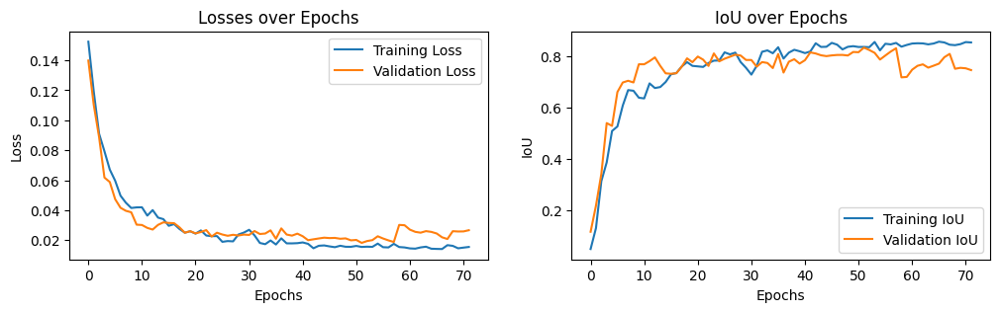

In [65]:
from S7_tools import plot_loss_and_metrics

plot_loss_and_metrics(train_losses, train_ious, valid_losses, valid_ious)


In [67]:
torch.save(model.state_dict(), "unet-seed23_weights.pth")
torch.save(optimizer.state_dict(), "unet-seed23-optimizer_state.pth")


In [81]:
importlib.reload(S7_tools)
from S7_tools import compute_confusion_matrix_with_distributions, display_confusion_matrix_with_metrics_and_distributions

Test loader dataset size: 36
Batch size: 40, Total batches: 1
Processing batch 1/1: 36 images.
Batch 1 shapes - preds: torch.Size([36, 1, 256, 256]), masks: torch.Size([36, 1, 256, 256])
Flattened batch 1 shapes - preds: (2359296,), masks: (2359296,)
Final concatenated shapes - all_preds: (2359296,), all_masks: (2359296,)
----------------------------------------------------------------------
TP:157967	TN:2184814	FP:4630		FN:11885
----------------------------------------------------------------------


Accuracy:     0.9930	               (TP + TN) / (TP + TN + FP + FN)
Recall:       0.9300	                      TP / (TP + FN)
Specificity:  0.9979	                      TN / (TN + FP)
Precision:    0.9715	                      TP / (TP + FP)
F1-Score:     0.9503	    (2*precision*recall) / (precision + recall)
IoU:          0.9053	                      TP / (TP + FN + FP)





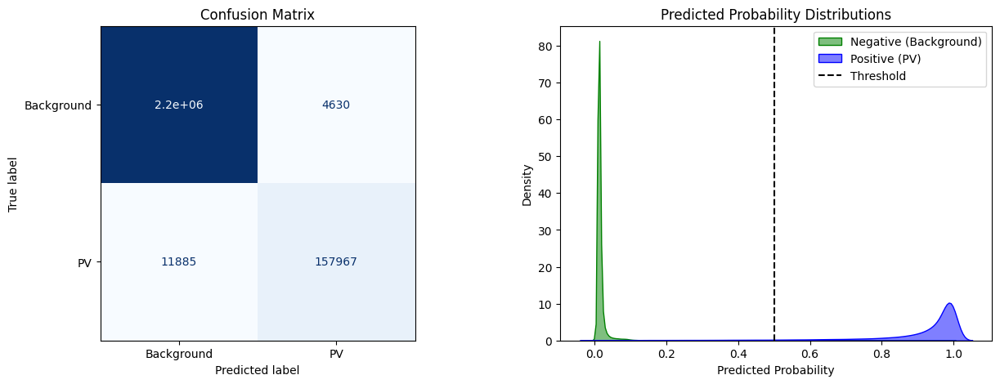

In [83]:
# Compute Confusion Matrix and plot
cm, pos_probs, neg_probs, nb_of_images_eval = compute_confusion_matrix_with_distributions(model, test_loader, DEVICE)
display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval)


### Second Model: **FPN** - *Feature Pyramid Networks*

In [177]:
ENCODER = 'efficientnet-b7'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['solar_panel']
ACTIVATION = 'sigmoid'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

model = smp.FPN(
    in_channels = 4 if use_all_bands else 1,
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS,     
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

FPN is a lightweight architecture that creates a feature pyramid by fusing multi-scale features from different levels of the encoder. It’s efficient and effective in handling scale variations. (paper: https://arxiv.org/pdf/1612.03144)


In [184]:
import gc  # For garbage collection

# Following, we incorporate these steps before start training a new model. 
# This helps optimize GPU memory usage and avoid potential slowdowns during subsequent training runs.

# Clear GPU memory
torch.cuda.empty_cache()
gc.collect()

# Reset GradScaler
scaler = torch.amp.GradScaler('cuda')

optimizer = torch.optim.AdamW(
    model.parameters(), 
    lr=0.0001,               
    weight_decay=1e-6        
    )

loss = BCEFocalNegativeIoULoss(alpha=0.8, gamma=2)

# Adjusts every 'step_size' epochs, decreasing by 'gamma'*100 %
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Reset the dataset loaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=0)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=False, num_workers=0)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=40, shuffle=False, num_workers=0)

In [186]:
importlib.reload(S7_tools)
from S7_tools import train_loop

In [188]:
train_losses, train_ious, valid_losses, valid_ious, _, _ = \
train_loop(model = model, 
           train_loader = train_loader, 
           valid_loader = valid_loader, 
           test_loader = test_loader, 
           optimizer = optimizer, 
           loss = loss, 
           scheduler = scheduler, 
           early_stopping_patience = 10, 
           early_stopping_min_delta = 0.0001, 
           model_filename = './models/FPN_effb7.pth', 
           device = DEVICE)


Epoch: 0
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.116722 | Train IoU: 0.080
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.109640 | Valid IoU: 0.130
Model saved!

Epoch: 1
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.058092 | Train IoU: 0.391
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.108663 | Valid IoU: 0.152
Model saved!

Epoch: 2
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.049799 | Train IoU: 0.469
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.102956 | Valid IoU: 0.210
Model saved!

Epoch: 3
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.047337 | Train IoU: 0.487
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.122870 | Valid IoU: 0.136

Epoch: 4
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.038682 | Train IoU: 0.573
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.132338 | Valid IoU: 0.115

Epoch: 5
Discard 0s? True	| 0s

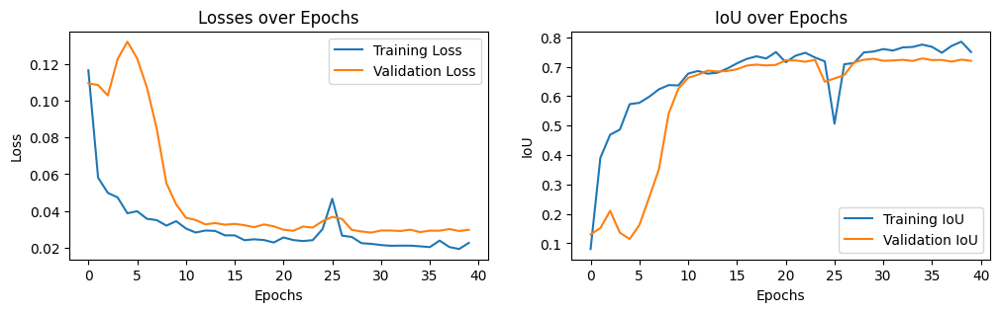

In [190]:
plot_loss_and_metrics(train_losses, train_ious, valid_losses, valid_ious)

In [192]:
# Save model's params
torch.save(model.state_dict(), "FPN-seed23_weights.pth")
torch.save(optimizer.state_dict(), "FPN-seed23-optimizer_state.pth")


Test loader dataset size: 36
Batch size: 40, Total batches: 1
Processing batch 1/1: 36 images.
Batch 1 shapes - preds: torch.Size([36, 1, 256, 256]), masks: torch.Size([36, 1, 256, 256])
Flattened batch 1 shapes - preds: (2359296,), masks: (2359296,)
Final concatenated shapes - all_preds: (2359296,), all_masks: (2359296,)
----------------------------------------------------------------------
TP:140597	TN:2186222	FP:3222		FN:29255
----------------------------------------------------------------------


Accuracy:     0.9862	               (TP + TN) / (TP + TN + FP + FN)
Recall:       0.8278	                      TP / (TP + FN)
Specificity:  0.9985	                      TN / (TN + FP)
Precision:    0.9776	                      TP / (TP + FP)
F1-Score:     0.8965	    (2*precision*recall) / (precision + recall)
IoU:          0.8124	                      TP / (TP + FN + FP)





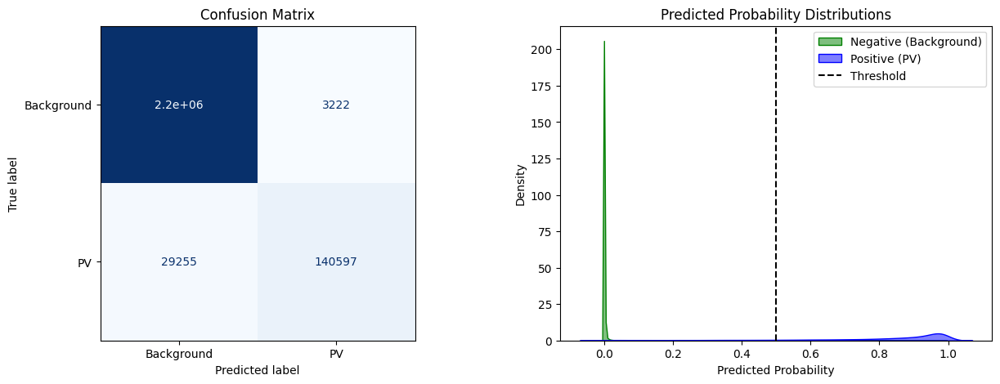

In [194]:
# Compute Confusion Matrix and plot
cm, pos_probs, neg_probs, nb_of_images_eval = compute_confusion_matrix_with_distributions(model, test_loader, DEVICE)
display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval)


### Third Model: **U-Net++**

In [151]:
ENCODER = 'efficientnet-b7'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['solar_panel']
ACTIVATION = 'sigmoid'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

model = smp.UnetPlusPlus(
    in_channels = 4 if use_all_bands else 1,
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
)
preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

U-Net++ is an extension of U-Net that introduces nested skip pathways to refine feature maps at multiple levels. This refinement is particularly helpful in semantic segmentation for high-resolution satellite images with small or irregular objects (like photovoltaic panels). Paper: https://arxiv.org/pdf/1807.10165
    

In [154]:
optimizer = torch.optim.AdamW(
    model.parameters(), 
    lr=0.0001,               
    weight_decay=1e-6        
    )

loss = BCEFocalNegativeIoULoss(alpha=0.8, gamma=2)

# Adjusts every 'step_size' epochs, decreasing by 'gamma'*100 %
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

In [156]:
train_losses, train_ious, valid_losses, valid_ious, _, _ = \
train_loop(model = model, 
           train_loader = train_loader, 
           valid_loader = valid_loader, 
           test_loader = test_loader, 
           optimizer = optimizer, 
           loss = loss, 
           scheduler = scheduler, 
           early_stopping_patience = 10, 
           early_stopping_min_delta = 0.0001, 
           model_filename = './models/unetpp_effb7.pth', 
           device = DEVICE)


Epoch: 0
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.130089 | Train IoU: 0.066
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.123968 | Valid IoU: 0.006
Model saved!

Epoch: 1
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.105325 | Train IoU: 0.169
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.117597 | Valid IoU: 0.006
Model saved!

Epoch: 2
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.082658 | Train IoU: 0.352
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.104649 | Valid IoU: 0.091
Model saved!

Epoch: 3
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.068201 | Train IoU: 0.474
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.068726 | Valid IoU: 0.462
Model saved!

Epoch: 4
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.059669 | Train IoU: 0.512
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.065249 | Valid IoU: 0.491
Model saved!

Epoc

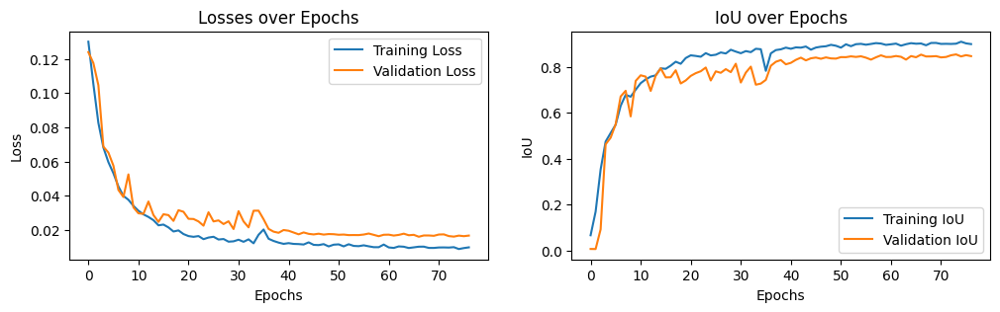

In [171]:
plot_loss_and_metrics(train_losses, train_ious, valid_losses, valid_ious)

In [173]:
# Save model's params
torch.save(model.state_dict(), "unetpp-seed23_weights.pth")
torch.save(optimizer.state_dict(), "unetpp-seed23-optimizer_state.pth")


Test loader dataset size: 36
Batch size: 40, Total batches: 1
Processing batch 1/1: 36 images.
Batch 1 shapes - preds: torch.Size([36, 1, 256, 256]), masks: torch.Size([36, 1, 256, 256])
Flattened batch 1 shapes - preds: (2359296,), masks: (2359296,)
Final concatenated shapes - all_preds: (2359296,), all_masks: (2359296,)
----------------------------------------------------------------------
TP:147531	TN:2188593	FP:851		FN:22321
----------------------------------------------------------------------


Accuracy:     0.9902	               (TP + TN) / (TP + TN + FP + FN)
Recall:       0.8686	                      TP / (TP + FN)
Specificity:  0.9996	                      TN / (TN + FP)
Precision:    0.9943	                      TP / (TP + FP)
F1-Score:     0.9272	    (2*precision*recall) / (precision + recall)
IoU:          0.8643	                      TP / (TP + FN + FP)





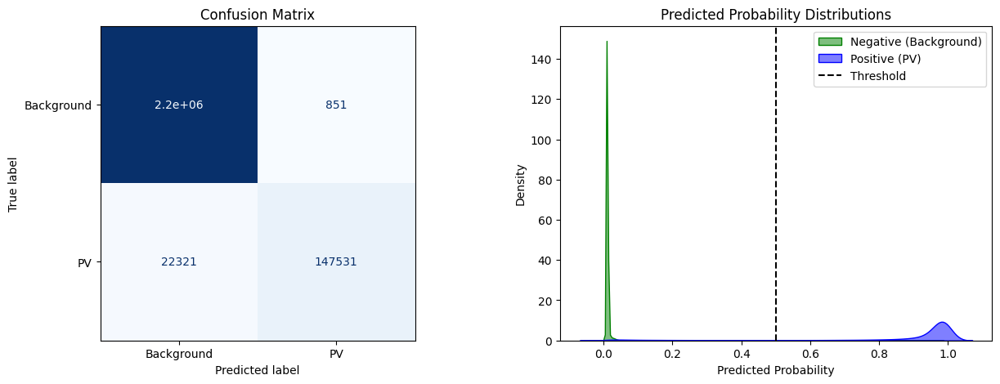

In [175]:
# Compute Confusion Matrix and plot
cm, pos_probs, neg_probs, nb_of_images_eval = compute_confusion_matrix_with_distributions(model, test_loader, DEVICE)
display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval)

### Fourth Model: **DLV3** - *DeepLabV3*

We observed that DeepLabV3 with EfficientNet-b7 struggled with small input image sizes, such as 256×256, due to the aggressive downsampling employed by both the encoder (EfficientNet) and the model's architecture.

DeepLabV3 relies on preserving spatial resolution to effectively apply Atrous Spatial Pyramid Pooling (ASPP). However, when the feature map is reduced to 1×1, there is no spatial context left for ASPP to operate, rendering the model ineffective for semantic segmentation at this scale.

Two possible solutions to address this issue are:
- Increase Input Size: use larger input dimensions (ex: 512×512) to better preserve spatial resolution throughout the encoder-decoder process.
- Adjust the Encoder: modify the strides or pooling operations in the EfficientNet-b7 encoder to reduce the degree of downsampling.

Both options would require significant adjustments to the current setup and may not align with the constraints of this model selection process. Therefore, we have decided to exclude this model from further consideration in this Notebook.

### Fifth Model: **PSPNet** - *Pyramid Scene Parsing Network*

In [197]:
ENCODER = 'efficientnet-b7'
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['solar_panel']
ACTIVATION = 'sigmoid'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

model = smp.PSPNet(
    in_channels = 4 if use_all_bands else 1,
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS,     
    classes=len(CLASSES), 
    activation=ACTIVATION,
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)

PSPNet is designed for scene parsing and excels in capturing global context. It divides the feature map into regions and processes them at different scales, which can be useful in satellite imagery with varying landscape features. Paper: https://arxiv.org/pdf/1612.01105


In [199]:
# Following, we incorporate these steps before start training a new model. 
# This helps optimize GPU memory usage and avoid potential slowdowns during subsequent training runs.

# Clear GPU memory
torch.cuda.empty_cache()
gc.collect()

# Reset GradScaler
scaler = torch.amp.GradScaler('cuda')

optimizer = torch.optim.AdamW(
    model.parameters(), 
    lr=0.0001,               
    weight_decay=1e-6        
    )

loss = BCEFocalNegativeIoULoss(alpha=0.8, gamma=2)

# Adjusts every 'step_size' epochs, decreasing by 'gamma'*100 %
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5)

# Reset the dataset loaders
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=0)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=5, shuffle=False, num_workers=0)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=40, shuffle=False, num_workers=0)

In [201]:
train_losses, train_ious, valid_losses, valid_ious, _, _ = \
train_loop(model = model, 
           train_loader = train_loader, 
           valid_loader = valid_loader, 
           test_loader = test_loader, 
           optimizer = optimizer, 
           loss = loss, 
           scheduler = scheduler, 
           early_stopping_patience = 10, 
           early_stopping_min_delta = 0.0001, 
           model_filename = './models/PSPNet_effb7.pth', 
           device = DEVICE)


Epoch: 0
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.105356 | Train IoU: 0.005
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.111973 | Valid IoU: 0.003
Model saved!

Epoch: 1
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.082419 | Train IoU: 0.150
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.079933 | Valid IoU: 0.267
Model saved!

Epoch: 2
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.064624 | Train IoU: 0.310
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.070778 | Valid IoU: 0.364
Model saved!

Epoch: 3
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.057078 | Train IoU: 0.388
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.069624 | Valid IoU: 0.385
Model saved!

Epoch: 4
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.045291 | Train IoU: 0.516
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.082158 | Valid IoU: 0.291

Epoch: 5
Skipped 

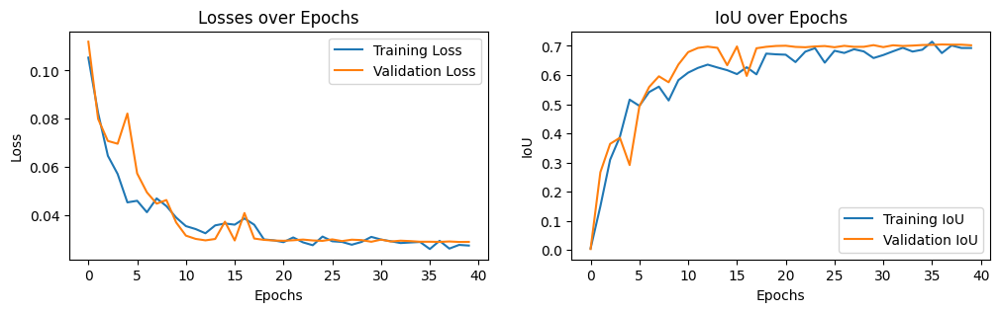

In [205]:
plot_loss_and_metrics(train_losses, train_ious, valid_losses, valid_ious)

In [207]:
# Save model's params
torch.save(model.state_dict(), "PSPNet-seed23_weights.pth")
torch.save(optimizer.state_dict(), "PSPNet-seed23-optimizer_state.pth")


Test loader dataset size: 36
Batch size: 40, Total batches: 1
Processing batch 1/1: 36 images.
Batch 1 shapes - preds: torch.Size([36, 1, 256, 256]), masks: torch.Size([36, 1, 256, 256])
Flattened batch 1 shapes - preds: (2359296,), masks: (2359296,)
Final concatenated shapes - all_preds: (2359296,), all_masks: (2359296,)
----------------------------------------------------------------------
TP:133765	TN:2183419	FP:6025		FN:36087
----------------------------------------------------------------------


Accuracy:     0.9822	               (TP + TN) / (TP + TN + FP + FN)
Recall:       0.7875	                      TP / (TP + FN)
Specificity:  0.9972	                      TN / (TN + FP)
Precision:    0.9569	                      TP / (TP + FP)
F1-Score:     0.8640	    (2*precision*recall) / (precision + recall)
IoU:          0.7606	                      TP / (TP + FN + FP)





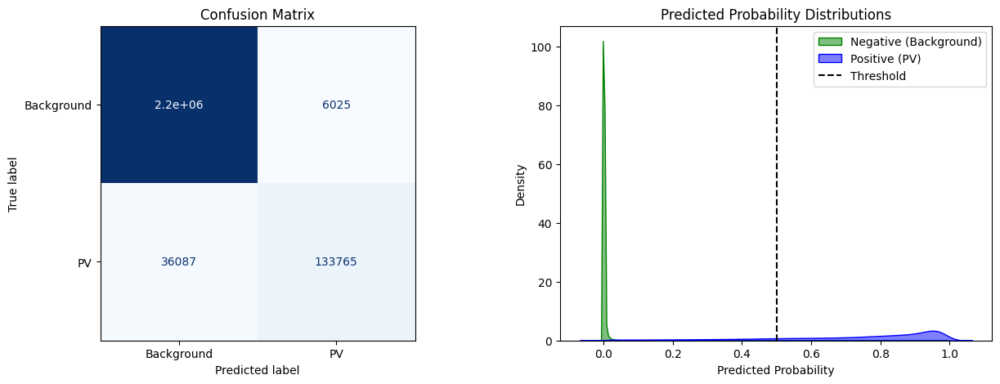

In [209]:
# Compute Confusion Matrix and plot
cm, pos_probs, neg_probs, nb_of_images_eval = compute_confusion_matrix_with_distributions(model, test_loader, DEVICE)
display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval)

In [181]:
importlib.reload(S7_tools)
from S7_tools import train_loop

In [183]:
train_loop(model,'./models/FPN_effb7.pth', DEVICE)


Epoch: 0


NameError: name 'train_loader' is not defined

## Adding Data Augmentation

In [27]:
class SynchronizedTransform:
    def __init__(self, transforms):
        self.transforms = transforms

    def __call__(self, image, mask):
        # Convert tensors to NumPy arrays if needed
        if isinstance(image, torch.Tensor):
            image = image.numpy()  # Convert tensor to NumPy array
        if isinstance(mask, torch.Tensor):
            mask = mask.numpy()  # Convert tensor to NumPy array
        
        
        # Convert numpy arrays to PIL images
        #image = Image.fromarray((image * 255).astype(np.uint8))  # Scale to 0-255 for display

        # Convert numpy arrays to PIL images
        if image.ndim == 3 and image.shape[-1] == 1:  # Single-band images
            image = image.squeeze(-1)  # Remove the singleton channel

        # Conver to PIL images
        image = Image.fromarray((image * 255).astype(np.uint8))  # Scale to 0-255
        mask = Image.fromarray((mask * 255).astype(np.uint8))

        
        for transform in self.transforms:
            if isinstance(transform, transforms.RandomHorizontalFlip):
                if torch.rand(1).item() < 0.5:
                    image = TF.hflip(image)
                    mask = TF.hflip(mask)
            elif isinstance(transform, transforms.RandomVerticalFlip):
                if torch.rand(1).item() < 0.5:
                    image = TF.vflip(image)
                    mask = TF.vflip(mask)
            elif isinstance(transform, transforms.RandomChoice):
                # Pick a random rotation angle from the specified options
                angle = random.choice([0, 90, 180, 270])
                image = TF.rotate(image, angle)
                mask = TF.rotate(mask, angle)
            elif isinstance(transform, transforms.ToTensor):
                image = TF.to_tensor(image)
                mask = TF.to_tensor(mask)

        return image, mask
        


In [29]:
simple_transform = SynchronizedTransform([
    transforms.ToTensor()  # Convert both image and mask to tensor
])

# augmentation_transform = SynchronizedTransform([
#     transforms.RandomHorizontalFlip(),
#     transforms.RandomVerticalFlip(),
#     transforms.RandomChoice([
#         transforms.RandomRotation(0),
#         transforms.RandomRotation(90),
#         transforms.RandomRotation(180),
#         transforms.RandomRotation(270)
#     ]),
#     transforms.ToTensor()
# ])


augmentation_transform = SynchronizedTransform([
    transforms.RandomHorizontalFlip(),
    transforms.RandomVerticalFlip(),
    # transforms.RandomChoice([
    #     transforms.RandomRotation(0),
    #     transforms.RandomRotation(90),
    #     transforms.RandomRotation(180),
    #     transforms.RandomRotation(270)
    # ]),
    transforms.ToTensor()
])

use_all_bands = False
model_band = 3 # 0:red, 1:green, 2:blue, 3:NIR, None:all 4 bands

train_dataset = CustomDataset(train_image_paths, train_mask_paths, transform=augmentation_transform, band=model_band)
val_dataset = CustomDataset(val_image_paths, val_mask_paths, transform=simple_transform, band=model_band)
test_dataset = CustomDataset(test_image_paths, test_mask_paths, transform=simple_transform, band=model_band)

image, mask = train_dataset[0]  # Load the first item
print(f"Transformed image shape: {image.shape}, dtype: {image.dtype}")
print(f"Transformed mask shape: {mask.shape}, dtype: {mask.dtype}")

Transformed image shape: torch.Size([1, 512, 512]), dtype: torch.float32
Transformed mask shape: torch.Size([1, 512, 512]), dtype: torch.float32


### Control the synchronization of Data Augmentation transforms 

In [32]:
def visualize_augmentations(dataset, num_samples=3):
    for i in range(num_samples):
        image, mask = dataset[i]
        
        # Display input image and mask side-by-side
        plt.figure(figsize=(10, 5))
        
        plt.subplot(1, 2, 1)
        plt.imshow(image.permute(1, 2, 0))  # Convert CHW to HWC for display
        plt.title("Augmented Image")
        
        plt.subplot(1, 2, 2)
        plt.imshow(mask[0], cmap='gray')  # Show mask in grayscale
        plt.title("Augmented Mask")
        
        plt.show()

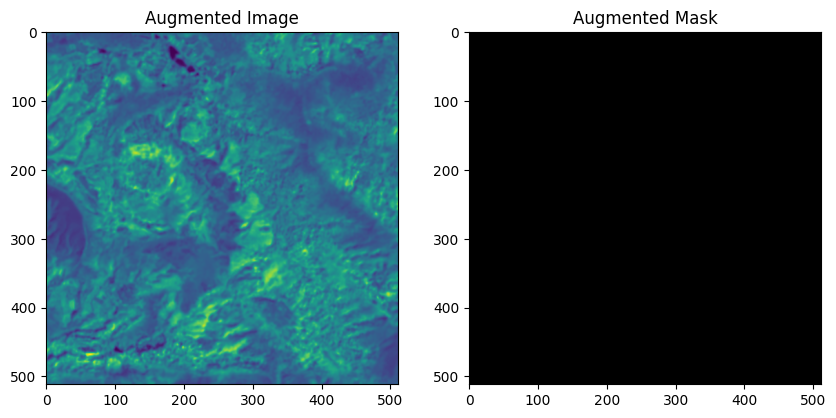

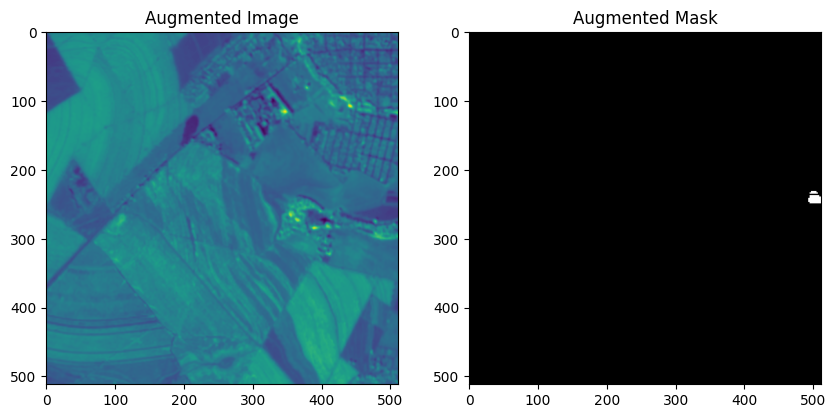

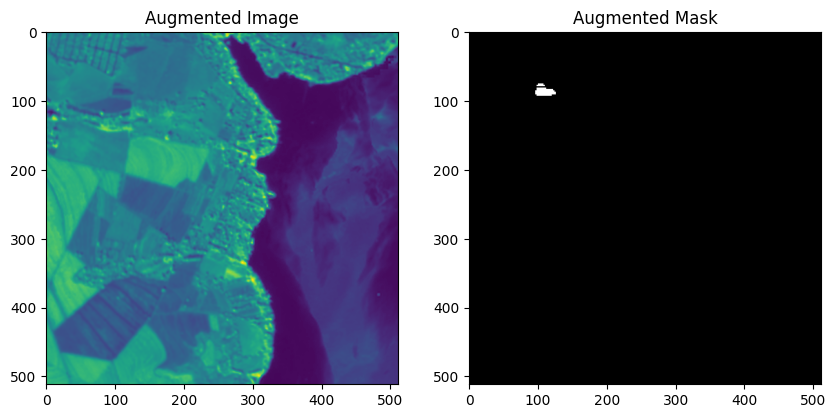

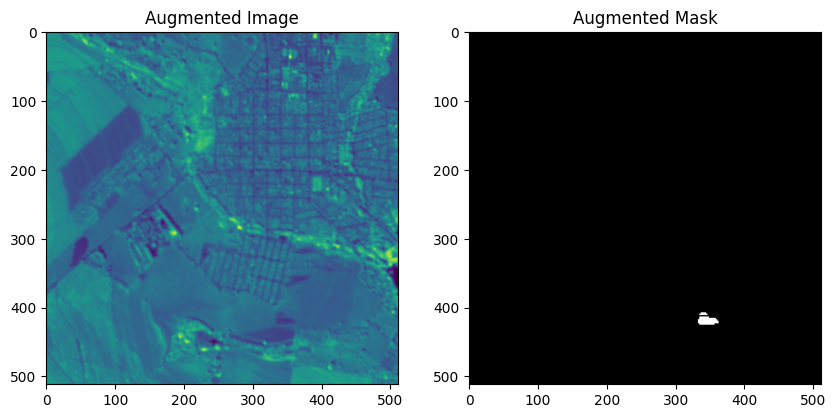

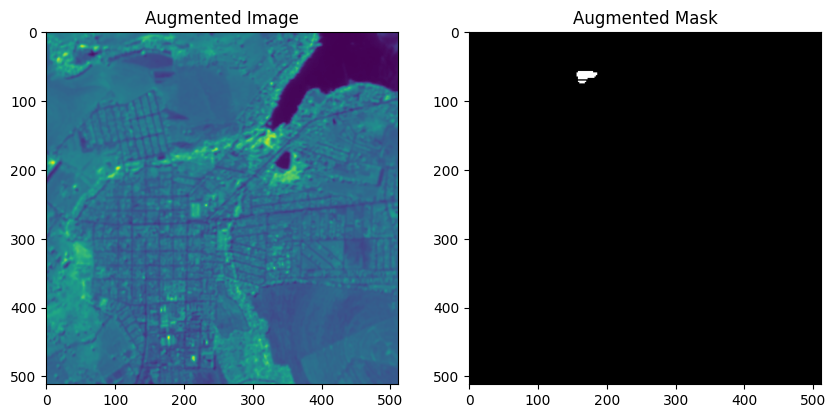

...

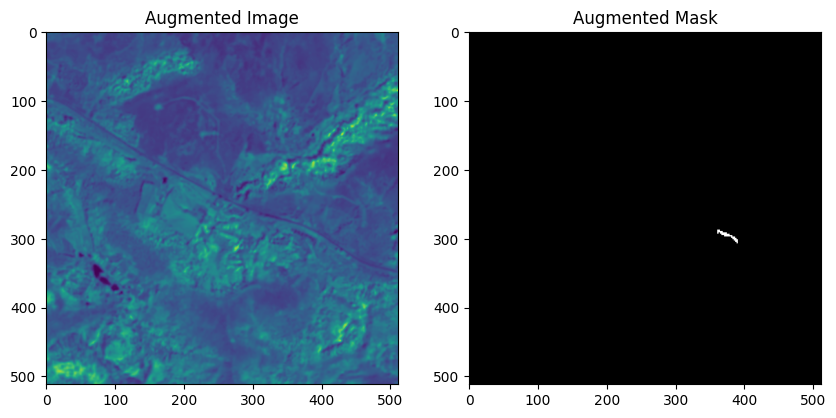

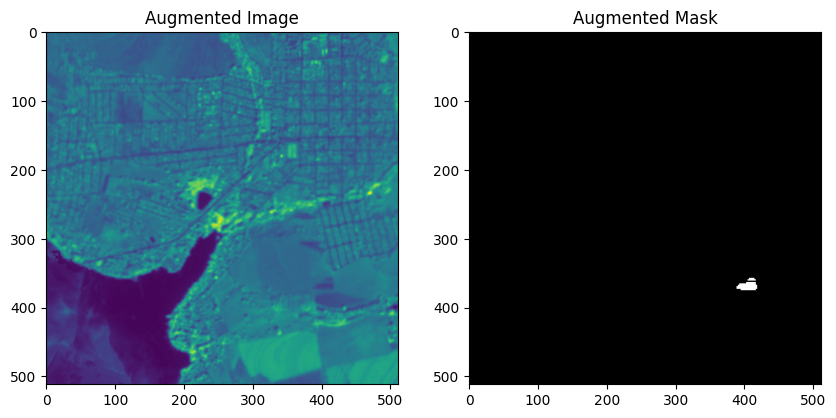

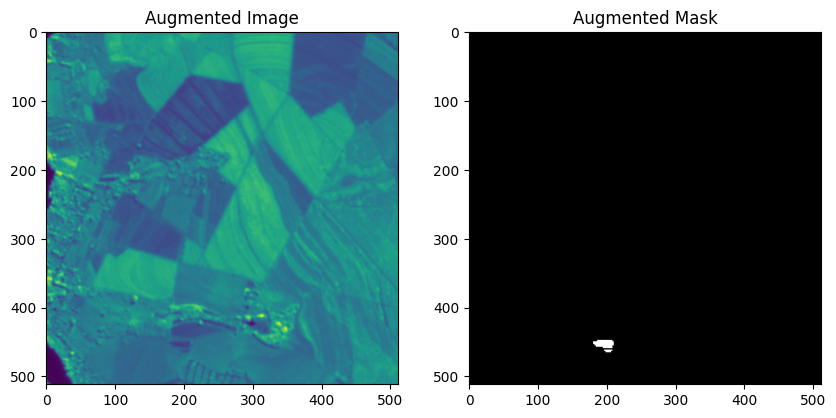

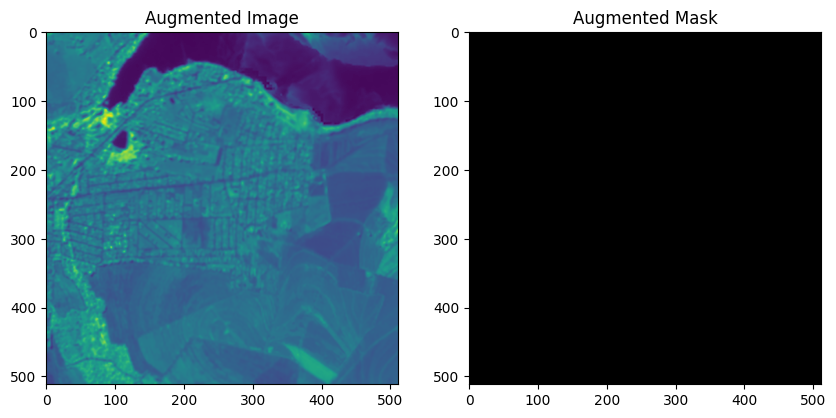

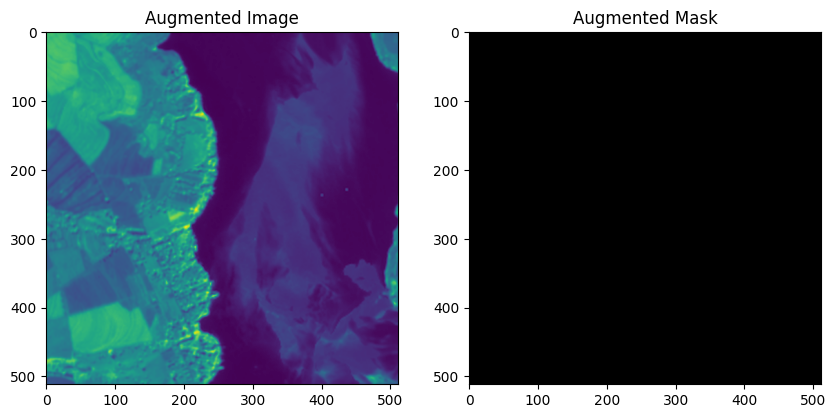

In [34]:
visualize_augmentations(train_dataset, num_samples=15)

In [35]:
train_dataset.image_paths[:20], train_dataset.target_paths[:20]

(['../5-Data_Wrangling/data_split2sr/train/input\\img(100).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1001).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1002).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1003).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1004).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1005).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1006).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1007).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1008).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1009).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(101).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1010).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1011).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1012).tif',
  '../5-Data_Wrangling/data_split2sr/train/input\\img(1013).tif',
  '../5-Data

In [36]:
image_datasets = {
    'train': train_dataset, 'val': val_dataset, 'test': test_dataset
}

#dataloaders = {
#    'train': torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=0),
#    'val': torch.utils.data.DataLoader(val_dataset, batch_size=10, shuffle=False, num_workers=0),
#    'test': torch.utils.data.DataLoader(test_dataset, batch_size=10, shuffle=False, num_workers=0)
#}

# Import Model

In [38]:
ENCODER = 'efficientnet-b7'
#ENCODER = 'efficientnet-b0' #for DeepLabV3+
ENCODER_WEIGHTS = 'imagenet'
CLASSES = ['solar_panel']
ACTIVATION = 'sigmoid'
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

#model = smp.Unet(
#model = smp.DeepLabV3Plus(
model = smp.UnetPlusPlus(
    in_channels = 4 if use_all_bands else 1, #4 for all bands
    encoder_name=ENCODER, 
    encoder_weights=ENCODER_WEIGHTS, 
    classes=len(CLASSES), 
    activation=ACTIVATION,
    #decoder_atrous_rates = (6, 12, 24) # for DeepLabv3+
    #decoder_dropout=0.3
       
)

preprocessing_fn = smp.encoders.get_preprocessing_fn(ENCODER, ENCODER_WEIGHTS)


# Loss & Optimizer

In [40]:

class WeightedBCELoss(nn.Module):
    def __init__(self, pos_weight=1.0, neg_weight=1.0):
        super(WeightedBCELoss, self).__init__()
        self.pos_weight = pos_weight  # Weight for positive class
        self.neg_weight = neg_weight  # Weight for negative class

    def forward(self, inputs, targets):
        # print(f"weights: pos {self.pos_weight} neg {self.neg_weight}") # debugging
        # Weighted BCE computation
        loss = -self.pos_weight * targets * torch.log(inputs + 1e-7) - \
               self.neg_weight * (1 - targets) * torch.log(1 - inputs + 1e-7)
        return loss.mean()

class BCEFocalNegativeIoULoss(nn.Module):
    def __init__(self, alpha=0.8, gamma=1.5, pos_weight=2.0, neg_weight=1.0):
        """
        Args:
            alpha: Weight for Focal Loss.
            gamma: Modulating factor for Focal Loss.
            pos_weight: Weight for positive class in BCE Loss.
            neg_weight: Weight for negative class in BCE Loss.
        """
        super(BCEFocalNegativeIoULoss, self).__init__()
        self.bce = WeightedBCELoss(pos_weight=pos_weight, neg_weight=neg_weight)
        self.alpha = alpha
        self.gamma = gamma

    def focal_loss(self, inputs, targets):
        BCE_loss = -targets * torch.log(inputs + 1e-7) - (1 - targets) * torch.log(1 - inputs + 1e-7)
        #pt = torch.exp(-BCE_loss)  # Probability of the true class
        pt = inputs * targets + (1 - inputs) * (1 - targets)
        F_loss = self.alpha * (1 - pt) ** self.gamma * BCE_loss
        return F_loss.mean()

    def forward(self, inputs, targets):
        if targets.sum() == 0:  # Skip blank masks
            return torch.tensor(0.0, requires_grad=True).to(inputs.device)

        # Core loss components
        bce_loss = self.bce(inputs, targets)
        focal_loss = self.focal_loss(inputs, targets)

        # Compute IoU for positive and negative classes
        #preds = inputs.sigmoid()  # Apply sigmoid activation
        preds = inputs
        #preds = model(inputs)  # No need to apply sigmoid again if already applied in the model
        iou_positive, mean_iou = compute_class_aware_iou(preds, targets)

        # Jaccard Loss for Positive and Negative IoU
        jaccard_loss_positive = 1.0 - iou_positive  # Positive IoU
        jaccard_loss_negative = 1.0 - (2 * mean_iou - iou_positive)  # Derive Negative IoU

        # Weighted Jaccard Loss
        jaccard_loss = 0.85 * jaccard_loss_positive + 0.15 * jaccard_loss_negative

        # Combine all losses
        total_loss = 0.3 * bce_loss + 0.3 * focal_loss + 0.4 * jaccard_loss
        return total_loss

#loss = BCEFocalJaccardLoss(alpha=0.8, gamma=2)
#loss = BCEFocalJaccardIoULoss(alpha=0.8, gamma=1.5)
loss = BCEFocalNegativeIoULoss(alpha=0.8, gamma=2)

    
# optimizer = torch.optim.Adam([ 
#     dict(params=model.parameters(), lr=0.0006),
#     #dict(params=model.parameters(), lr=0.00001),
# ])

optimizer = torch.optim.AdamW(
    model.parameters(), 
    #lr=0.0006,               
    lr=0.0001,               
    weight_decay=1e-6        
    #weight_decay=0        
)

# Initialize the Global Threshold to predict sigmoid inputs
g_threshold = 0.5


# Adjusts every 'step_size' epochs, decreasing by 'gamma'*100 %
#scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=20, gamma=0.1)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

# add Warmup to the scheduler
# num_epochs = 400
# num_warmup_steps = 50

# scheduler = get_cosine_schedule_with_warmup(
#     optimizer,
#     num_warmup_steps=num_warmup_steps,
#     num_training_steps=num_epochs * len(train_loader)
# )

E:\Devs\pyEnv-1\UCSD_MLBootcamp_Capstone\5b-Run_a_Model\5b-Model-env\Lib\site-packages\torch\optim\lr_scheduler.py:62: UserWarning: The verbose parameter is deprecated. Please use get_last_lr() to access the learning rate.
  warnings.warn(


### substitute SMP library to handle the trainig, validation and testing original loops.

In [42]:
# Replace DataLoader setup for training, validation, and testing
# train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=0)
# valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=40, shuffle=False, num_workers=0)
# test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=30, shuffle=False, num_workers=0)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=5, shuffle=True, num_workers=0)
valid_loader = torch.utils.data.DataLoader(val_dataset, batch_size=40, shuffle=False, num_workers=0)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=30, shuffle=False, num_workers=0)



In [43]:
from torch.amp import autocast, GradScaler


# Device setup
DEVICE = 'cuda' if torch.cuda.is_available() else 'cpu'

# Move the model to GPU
model = model.to(DEVICE)  # This moves your model to the GPU (or keeps it on CPU if no GPU)

def compute_class_aware_iou(preds, masks, threshold=0.5):
    """
    Compute IoU for positive and negative classes with a dynamic threshold.
    Args:
        preds: Predicted probabilities (logits or after sigmoid).
        masks: Ground truth masks.
        threshold: Threshold to classify predictions (default is 0.3).

    Returns:
        iou_positive: IoU for the positive class.
        mean_iou: Mean IoU across both classes.
    """
    # Apply threshold to predictions
    preds = (preds > threshold).int()
    masks = masks.int()

    preds_np = preds.cpu().numpy().reshape(-1)
    masks_np = masks.cpu().numpy().reshape(-1)

    # Compute IoU for positive and negative classes
    iou_positive = jaccard_score(masks_np, preds_np, pos_label=1)
    iou_negative = jaccard_score(masks_np, preds_np, pos_label=0)

    # Mean IoU
    mean_iou = (iou_positive + iou_negative) / 2
    return iou_positive, mean_iou


# Initialize AMP GradScaler
scaler = GradScaler('cuda')

# Updated DataLoader Settings
train_loader = torch.utils.data.DataLoader(
    train_dataset, 
    batch_size=4, 
    shuffle=True, 
    num_workers=0, 
    pin_memory=True
)
valid_loader = torch.utils.data.DataLoader(
    val_dataset, 
    batch_size=10, 
    shuffle=False, 
    num_workers=0, 
    pin_memory=True
)
test_loader = torch.utils.data.DataLoader(
    test_dataset, 
    batch_size=10, 
    shuffle=False, 
    num_workers=0, 
    pin_memory=True
)



# Define training loop function
def train_one_epoch(model, dataloader, optimizer, loss_fn, device, discard_allbkgnd = True):
    model.train()
    epoch_loss = 0
    total_iou = 0
    num_batches = 0
    iou_metric = JaccardIndex(task='binary', threshold=0.5).to(device)
    nb_blank = 0
    nb_tot_img = 0
    
    for images, masks in dataloader:
        images, masks = images.to(device), masks.to(device)

        # Check which images in the batch have all-background masks
        valid_mask_indices = [i for i in range(masks.size(0)) if masks[i].sum() > 0]
        
        # number of all-background images per batch
        nb_blank += masks.size(0) - len(valid_mask_indices)
        nb_tot_img += masks.size(0)

        # Control all background images
        if discard_allbkgnd == False:
            valid_mask_indices = range(masks.size(0))
            
        # Skip this batch if no valid masks
        if len(valid_mask_indices) == 0:
            print("Skipped batch with all all-background images.")
            continue  

        # Filter images and masks for valid entries
        valid_images = images[valid_mask_indices]
        valid_masks = masks[valid_mask_indices]

        optimizer.zero_grad()

        # Mixed Precision Forward Pass
        with autocast('cuda'):
            preds = model(valid_images)
            loss = loss_fn(preds, valid_masks)

        # # Forward pass
        # preds = model(valid_images)
        # loss = loss_fn(preds, valid_masks)
        epoch_loss += loss.item()

        
        # Mixed Precision Backward Pass
        scaler.scale(loss).backward()
        scaler.step(optimizer)
        scaler.update()

        # Backward pass and optimization
        # loss.backward()
        # optimizer.step()

        # Calculate IoU for valid images
        total_iou += iou_metric(preds, valid_masks).item() * len(valid_mask_indices)
        num_batches += len(valid_mask_indices)

    # Avoid division by zero if all batches are skipped
    avg_loss = epoch_loss / num_batches if num_batches > 0 else 0
    avg_iou = total_iou / num_batches if num_batches > 0 else 0
    print(f"Discard 0s? {discard_allbkgnd}\t| 0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Train Loss: {avg_loss:.6f} | Train IoU: {avg_iou:.3f}")
    return avg_loss, avg_iou


def validate_one_epoch(model, dataloader, loss_fn, device, threshold=0.5, discard_allbkgnd=True):
    model.eval()
    epoch_loss = 0
    total_iou = 0.0
    num_valid_images = 0
    iou_metric = JaccardIndex(task='binary', threshold=threshold).to(device)
    nb_blank = 0
    nb_tot_img = 0

    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)

            # Check which images in the batch have valid masks
            valid_mask_indices = [i for i in range(masks.size(0)) if masks[i].sum() > 0]

            # number of all-background images per batch
            nb_blank += masks.size(0) - len(valid_mask_indices)
            nb_tot_img += masks.size(0)

            # Control all background images
            if discard_allbkgnd == False:
                valid_mask_indices = range(masks.size(0))
                
            # Skip this batch if no valid masks
            if len(valid_mask_indices) == 0:
                print("Skipped batch with all all-background images.")
                continue  
            
            # Filter images and masks for valid entries
            valid_images = images[valid_mask_indices]
            valid_masks = masks[valid_mask_indices]

            # Mixed Precision Inference
            with autocast('cuda'):
                preds = model(valid_images)
                loss = loss_fn(preds, valid_masks)

            # preds = model(valid_images)
            # loss = loss_fn(preds, valid_masks)
            epoch_loss += loss.item()

            # Threshold predictions for metric computation
            preds = (preds > threshold).int()

            # Calculate IoU for valid images
            total_iou += iou_metric(preds, valid_masks).item() * len(valid_mask_indices)
            num_valid_images += len(valid_mask_indices)

    avg_loss = epoch_loss / num_valid_images if num_valid_images > 0 else 0
    avg_iou = total_iou / num_valid_images if num_valid_images > 0 else 0
    #print(f"0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Valid Loss: {avg_loss:.6f} | Valid IoU: {avg_iou:.3f}")
    print(f"Discard 0s? {discard_allbkgnd}\t| 0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Valid Loss: {avg_loss:.6f} | Valid IoU: {avg_iou:.3f}")
    return avg_loss, avg_iou
    

# Define test loop function
def test_one_epoch(model, dataloader, loss_fn, device, threshold=0.5, discard_allbkgnd = True):
    """
    Test the model for one epoch with a dynamic threshold.
    """
    model.eval()
    epoch_loss = 0
    total_iou = 0.0
    num_valid_images = 0
    #num_batches = 0
    iou_metric = JaccardIndex(task='binary', threshold=threshold).to(device)
    nb_blank = 0
    nb_tot_img = 0

    
    with torch.no_grad():
        for images, masks in dataloader:
            images, masks = images.to(device), masks.to(device)
        
                
            # debugging
            #print(f' deb: {j} masks.size(0) {masks.size(0)}')
            #print(f' deb: {j} images.size(0) {masks.size(0)}')
            
            valid_mask_indices = [i for i in range(masks.size(0)) if masks[i].sum() > 0]
            #print(f' deb: {j} len(valid_mask_indices) {len(valid_mask_indices)}')

            # number of all-background images per batch
            nb_blank += masks.size(0) - len(valid_mask_indices)
            nb_tot_img += masks.size(0)

            # Control all background images
            if discard_allbkgnd == False:
                valid_mask_indices = range(masks.size(0))
            
            # Skip this batch if no valid masks
            if len(valid_mask_indices) == 0:
                print("Skipped batch with all all-background images.")
                continue  
            
            # Filter images and masks for valid entries
            valid_images = images[valid_mask_indices]
            valid_masks = masks[valid_mask_indices]

            # Mixed Precision Inference
            with autocast('cuda'):
                preds = model(valid_images)
                loss = loss_fn(preds, valid_masks)

            # preds = model(valid_images)
            # loss = loss_fn(preds, valid_masks)
            epoch_loss += loss.item()

            # Threshold predictions
            preds = (preds > threshold).int()
            
            # Calculate IoU for valid images
            total_iou += iou_metric(preds, valid_masks).item() * len(valid_mask_indices)
            num_valid_images += len(valid_mask_indices)
            
    avg_loss = epoch_loss / num_valid_images if num_valid_images > 0 else 0
    avg_iou = total_iou / num_valid_images if num_valid_images > 0 else 0
    #print(f"0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Test Loss:  {avg_loss:.6f} | Test IoU: {avg_iou:.3f}")
    print(f"Discard 0s? {discard_allbkgnd}\t| 0s_masks/Tot_imgs: {nb_blank}/{nb_tot_img} \t|| Test Loss: {avg_loss:.6f} | Test IoU: {avg_iou:.3f}")
    return avg_loss, avg_iou


### Implement Early Stopping

In [105]:
class EarlyStopping:
    def __init__(self, patience=5, min_delta=0):
        """
        Args:
            patience (int): How many epochs to wait after last improvement before stopping.
            min_delta (float): Minimum change in the monitored metric to qualify as an improvement.
        """
        self.patience = patience
        self.min_delta = min_delta
        self.best_metric = np.inf  # Start with infinity for minimizing metrics (e.g., validation loss)
        self.counter = 0  # Count epochs without improvement

    def __call__(self, current_metric):
        # Check if the current metric is better than the best metric
        if current_metric < self.best_metric - self.min_delta:
            self.best_metric = current_metric
            self.counter = 0  # Reset counter if there is an improvement
            return False  # Do not stop, continue training
        else:
            self.counter += 1
            if self.counter >= self.patience:
                print("Early stopping triggered.")
                return True  # Stop training
            return False  # Continue training

In [55]:
import time

train_losses = []
valid_losses = []
test_losses = []
train_ious = []
valid_ious = []
test_ious = []

# Force to include the test set loss and score metric into the training loop
include_test=False

# Save the model's params: 
model_filename='./models/unetpp_effb7.pth'

max_score = float('inf')  # Initialize with a high value to store the best validation loss

# Initialize early stopping
#early_stopping = EarlyStopping(patience=10, min_delta=0.0001)
# best early stop for standard resolution 
#early_stopping = EarlyStopping(patience=20, min_delta=0.00001)

# short fuse <:-)
early_stopping = EarlyStopping(patience=10, min_delta=0.0001)

tic = time.time()
for epoch in range(0, 200):
    
    print(f'\nEpoch: {epoch}')
    
    # Run training
    train_loss, train_iou_score = train_one_epoch(model, train_loader, optimizer, loss_fn=loss, device=DEVICE, discard_allbkgnd = True)
    train_losses.append(train_loss)
    train_ious.append(train_iou_score)
    
    
    # Run validation
    valid_loss, valid_iou_score = validate_one_epoch(model, valid_loader, loss_fn=loss, device=DEVICE, discard_allbkgnd=True)
    valid_losses.append(valid_loss)
    valid_ious.append(valid_iou_score)

    # Check early stopping criteria with the validation loss
    if early_stopping(valid_loss):
        print(f"Stopping at epoch {epoch}")
        break  

    if include_test:
        # Run testing
        test_loss, test_iou_score = test_one_epoch(model, test_loader, loss_fn=loss, device=DEVICE, discard_allbkgnd = True)
        test_losses.append(test_loss)
        test_ious.append(test_iou_score)
    
    # Update the learning rate
    scheduler.step(valid_loss)
    
    # Save the model if validation loss improves
    if valid_loss < max_score:
        max_score = valid_loss
        #torch.save(model, './models/unet_effb7.pth')
        torch.save(model, model_filename)
        print('Model saved!')

toc = time.time()
elapsed_time = toc - tic
print(f"\nTraining completed in {elapsed_time // 60:.0f} minutes and {elapsed_time % 60:.2f} seconds.")



Epoch: 0
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.160889 | Train IoU: 0.038
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.069166 | Valid IoU: 0.032
Model saved!

Epoch: 1
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.126584 | Train IoU: 0.148
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.039589 | Valid IoU: 0.504
Model saved!

Epoch: 2
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.098953 | Train IoU: 0.332
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.031497 | Valid IoU: 0.616
Model saved!

Epoch: 3
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.082741 | Train IoU: 0.432
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.034194 | Valid IoU: 0.510

Epoch: 4
Discard 0s? True	| 0s_masks/Tot_imgs: 32/201 	|| Train Loss: 0.070719 | Train IoU: 0.511
Discard 0s? True	| 0s_masks/Tot_imgs: 4/35 	|| Valid Loss: 0.042195 | Valid IoU: 0.372

Epoch: 5
Discard 0s? True	| 0s

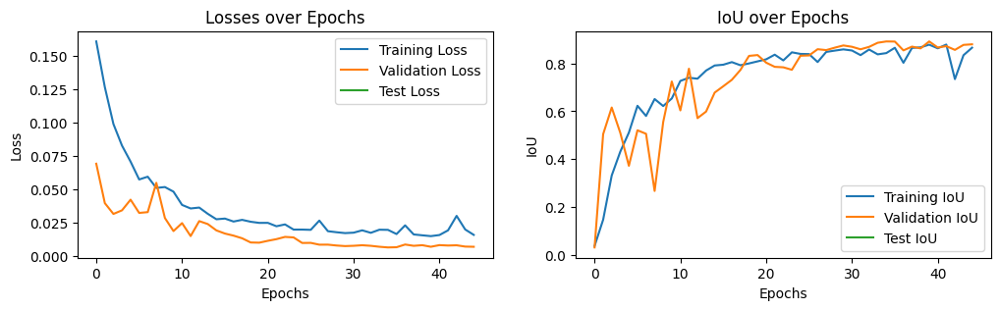

In [57]:
# Plot metrics after training
plt.figure(figsize=(12, 3))

# Plot training/validation losses
plt.subplot(1, 2, 1)
plt.plot(train_losses, label="Training Loss")
plt.plot(valid_losses, label="Validation Loss")
plt.plot(test_losses, label="Test Loss")
plt.title("Losses over Epochs")
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()

# Plot IoU for validation and test sets

plt.subplot(1, 2, 2)
plt.plot(train_ious, label="Training IoU")
plt.plot(valid_ious, label="Validation IoU")
plt.plot(test_ious, label="Test IoU")
plt.title("IoU over Epochs")
plt.xlabel("Epochs")
plt.ylabel("IoU")
plt.legend()

plt.show()

# LOAD MODEL

In [61]:
#DLV3
#model = torch.load('datasets/solar_panel/models_new/test.pth')
#model = torch.load('./models/dlv3_effb0.pth')
#model = torch.load('datasets/solar_panel/models_new/dlv3_r101.pth')
#model = torch.load('datasets/solar_panel/models_new/dlv3_r50.pth')

# UNET
#model = torch.load('datasets/solar_panel/models_new/unet_r101.pth')
#model = torch.load('datasets/solar_panel/models_new/unet_effb0.pth')
##model = torch.load('./models/unet_effb7.pth')
#model = torch.load('datasets/solar_panel/models_new/unet_r50.pth')

# UNET++
model = torch.load('./models/unetpp_effb7.pth')

#PSPNet
#model = torch.load('datasets/solar_panel/models_new/psp_effb7_at.pth')
#model = torch.load('datasets/solar_panel/models_new/psp_effb0.pth')
#model = torch.load('datasets/solar_panel/models_new/psp_r101.pth')
#model = torch.load('datasets/solar_panel/models_new/psp_r50.pth')

# FPN
#model = torch.load('datasets/solar_panel/models_new/fpn_effb7.pth')
#model = torch.load('datasets/solar_panel/models_new/fpn_effb0.pth')
#model = torch.load('datasets/solar_panel/models_new/fpn_r101.pth')
#model = torch.load('datasets/solar_panel/models_new/fpn_r50.pth')

C:\Users\fpere\AppData\Local\Temp\ipykernel_20204\578062882.py:14: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model = torch.load('./models/unetpp_effb7.pth')


# EVAL MODEL

In [64]:
import math
from torchmetrics import JaccardIndex

# Ensure no gradients are calculated, as this is evaluation
with torch.no_grad():
    model.eval()  # Set model to evaluation mode

    # Fetch a batch from the test loader
    inp, lab = next(iter(test_loader))
    inp = inp.to(DEVICE)
    lab = lab.to(DEVICE)

    # Predict
    pred = model(inp)
    #pred = (pred.sigmoid() > 0.5).float()
    #pred = pred.sigmoid()  

    # Reshape if necessary to match [batch_size, 1, height, width]
    if pred.shape[1] != 1:
        pred = pred.unsqueeze(1)

    if lab.shape[1] != 1:
        lab = lab.unsqueeze(1)

    # Calculate IoU score for the batch
    iou_metric = JaccardIndex(task='binary', threshold=0.5).to(DEVICE)  # Use binary IoU for evaluation
    iou_score = iou_metric(pred, lab)

    print(f"Sample IoU Score: {iou_score.item()}")

Sample IoU Score: 0.9334956407546997


# Accuracy, IoU, and F-score

In [66]:
# import numpy as np
# from sklearn.metrics import accuracy_score, jaccard_score, f1_score

# # Flatten the labels and predictions for metric computation
# lbl = lab.cpu().numpy().reshape(-1)  # Convert the ground truth mask to a 1D array
# target = pred.cpu().numpy().reshape(-1)  # Convert the predicted mask to a 1D array

# # Check value distributions in lbl and target
# #print(f"Label distribution: {np.unique(lbl, return_counts=True)}")
# #print(f"Prediction distribution: {np.unique(target, return_counts=True)}")

# # Convert predictions to binary format at two different thresholds

# target_25 = np.where(target > 0.25, 1, 0)
# target_50 = np.where(target > 0.5, 1, 0)
# target_75 = np.where(target > 0.75, 1, 0)

# # Ensure ground truth is binary
# lbl = np.where(lbl > 0.5, 1, 0)

# def compute_metrics(label, target_25, target_50, target_75):
#     # Compute accuracy at different thresholds
#     acc_25 = accuracy_score(label, target_25)
#     acc_50 = accuracy_score(label, target_50)
#     acc_75 = accuracy_score(label, target_75)
    
#     # Compute IoU (Jaccard score) at different thresholds
#     iou_25 = jaccard_score(label, target_25)
#     iou_50 = jaccard_score(label, target_50)
#     iou_75 = jaccard_score(label, target_75)
    
#     # Compute F1-score at different thresholds
#     f_25 = f1_score(label, target_25)
#     f_50 = f1_score(label, target_50)
#     f_75 = f1_score(label, target_75)
    
#     # Display results
#     print('Thresholds: \t 25% \t| 50% \t| 75%')
#     print(40*'-')
#     print('Accuracy:\t', round(acc_25 * 100, 2), '|', round(acc_50 * 100, 2), '|', round(acc_75 * 100, 2))
#     print('IoU:\t\t', round(iou_25 * 100, 2), '|', round(iou_50 * 100, 2), '|', round(iou_75 * 100, 2))
#     print('F-score:\t', round(f_25 * 100, 2), '|', round(f_50 * 100, 2), '|', round(f_75 * 100, 2))

# # Compute and display the metrics
# compute_metrics(lbl, target_25, target_50, target_75)

# Confusion Matrix

In [68]:
# from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# def compute_confusion_matrix(model, test_loader, device, threshold=0.5):
#     """
#     Compute the confusion matrix for predictions with a dynamic threshold.
#     """
#     model.eval()
#     all_preds = []
#     all_masks = []

#     nb_of_images_eval = 0
    
#     with torch.no_grad():
#         for images, masks in test_loader:
            
#             # Skip blank masks
#             if masks.sum() == 0:
#                 continue  
                
#             images = images.to(device)
#             masks = masks.to(device)

#             preds = model(images)

#             # Threshold predictions
#             preds = (preds > threshold).int()

#             all_preds.append(preds.cpu().numpy().ravel())
#             all_masks.append(masks.cpu().numpy().ravel())

#             nb_of_images_eval += 1

#     all_preds = np.concatenate(all_preds)
#     all_masks = np.concatenate(all_masks)

#     # Compute confusion matrix
#     cm = confusion_matrix(all_masks, all_preds, labels=[0, 1])
#     return cm, nb_of_images_eval


# def display_traditional_confusion_matrix_with_metrics(cm, nb_of_images):
#     """
#     Display the confusion matrix with the traditional layout and print additional metrics.
#     Args:
#         cm: Confusion matrix (2x2 for binary classification).
#     """
    
#     # New labels for the classes
#     labels = ["Background", "PV"]

#     # Extract values from confusion matrix
#     TN = cm[0, 0]  # True Negative
#     FP = cm[0, 1]  # False Positive
#     FN = cm[1, 0]  # False Negative
#     TP = cm[1, 1]  # True Positive

#     # Calculate metrics
#     accuracy = (TP + TN) / (TP + TN + FP + FN)
#     recall = TP / (TP + FN) if (TP + FN) > 0 else 0  # Sensitivity (Recall)
#     specificity = TN / (TN + FP) if (TN + FP) > 0 else 0  # True Negative Rate
#     precision = TP / (TP + FP) if (TP + FP) > 0 else 0  # Positive Predictive Value
#     f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
#     IoU = TP / (TP + FN + FP) if (TP + FN + FP) > 0 else 0  # IoU

#     # Print metrics
#     print(f"\nNb of images computed: {nb_of_images}")
#     print(f"TP:{TP}\tTN:{TN}\tFP:{FP}\t\tFN:{FN}")
#     print(70*'-')
#     print("\n")
#     print(f"Accuracy:     {accuracy:.4f}\t               (TP + TN) / (TP + TN + FP + FN)")
#     print(f"Recall:       {recall:.4f}\t                      TP / (TP + FN)")
#     print(f"Specificity:  {specificity:.4f}\t                      TN / (TN + FP)")
#     print(f"Precision:    {precision:.4f}\t                      TP / (TP + FP)")
#     print(f"F1-Score:     {f1_score:.4f}\t    (2*precision*recall) / (precision + recall)")
#     print(f"IoU:          {IoU:.4f}\t                      TP / (TP + FN + FP)")
#     print("\n\n")
    
#     # Display the confusion matrix
#     disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
#     disp.plot(cmap=plt.cm.Blues)
#     plt.title("Confusion Matrix")
#     plt.xlabel("Predicted label")
#     plt.ylabel("True label")
#     plt.show()


# # Example usage:
# cm, nb_of_images = compute_confusion_matrix(model, test_loader, DEVICE)
# display_traditional_confusion_matrix_with_metrics(cm, nb_of_images)



# SHOW PREDICTIONS

ID: 1 | IoU: 0.812


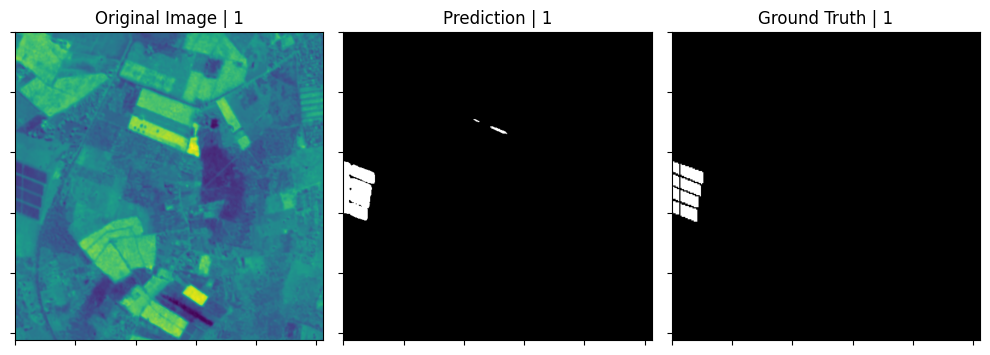

ID: 2 | IoU: 0.854


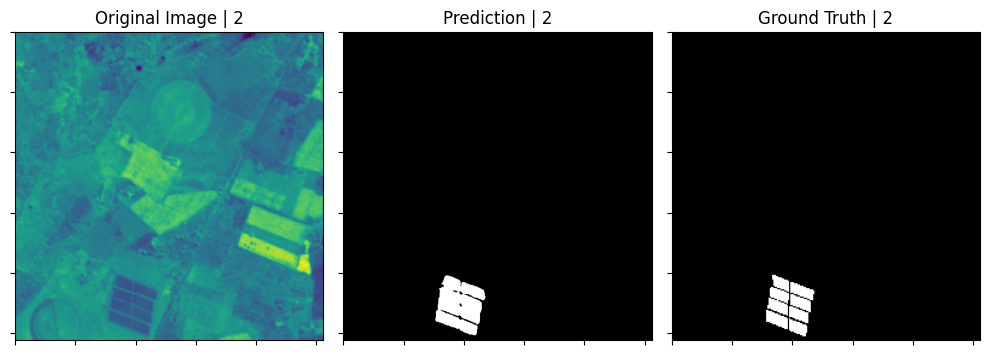

ID: 3 | IoU: 0.831


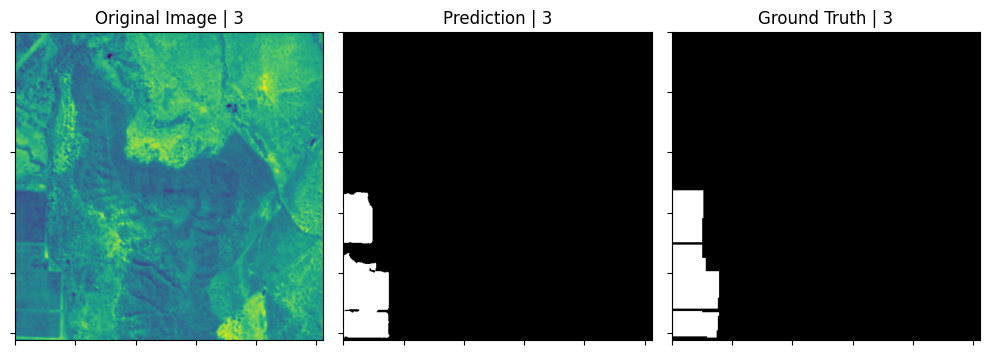

ID: 4 | IoU: 0.914


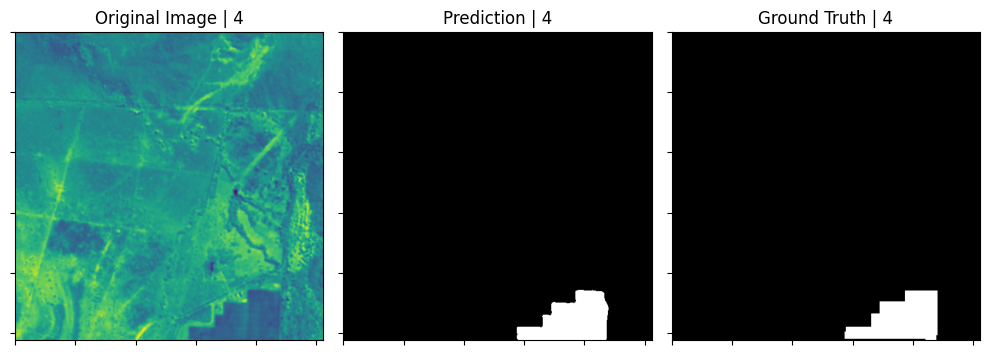

ID: 5 | IoU: 0.953


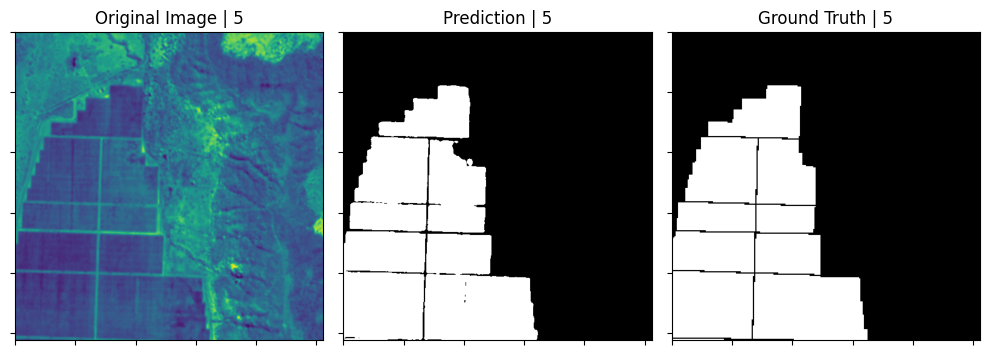

ID: 6 | IoU: 0.956


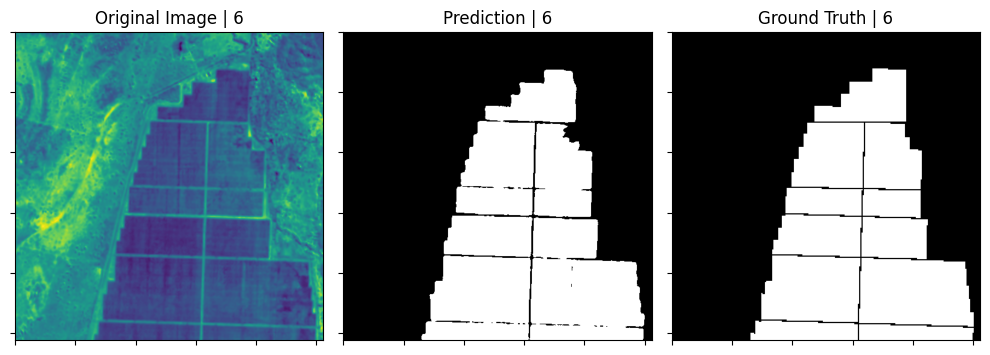

ID: 7 | IoU: 0.885


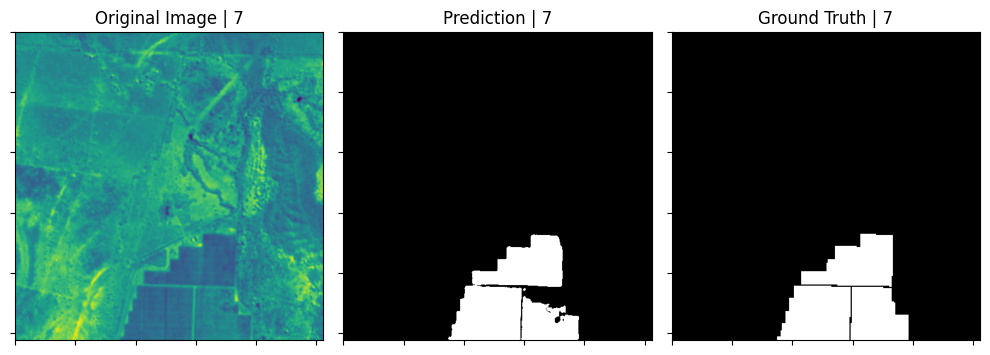

ID: 8 | IoU: 0.951


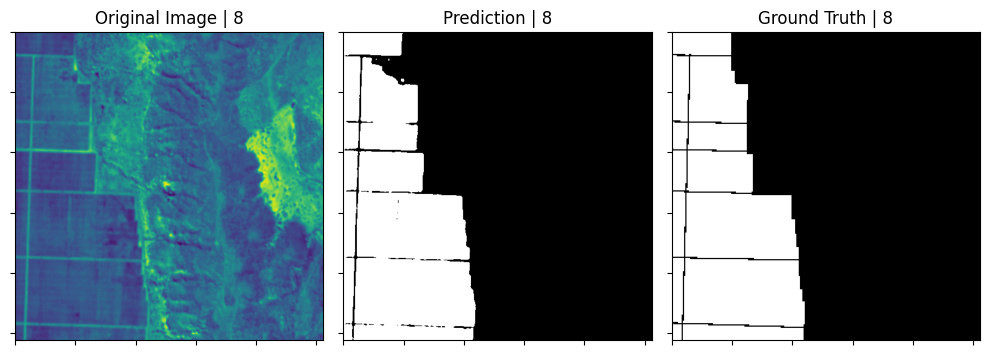

ID: 9 | IoU: 0.592


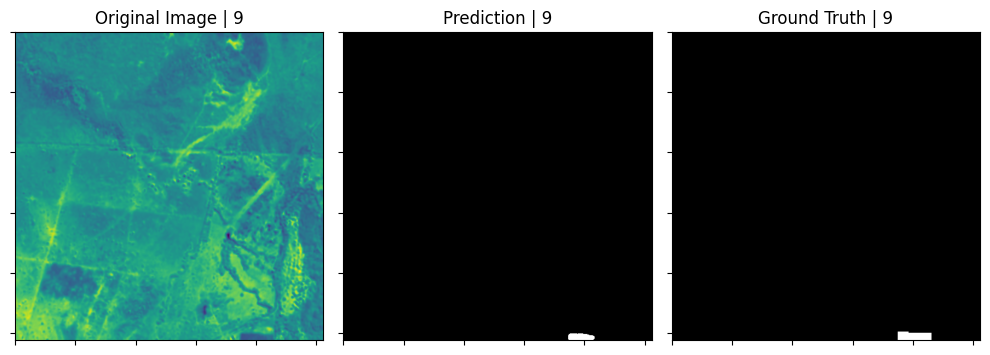

ID: 10 | IoU: 0.773


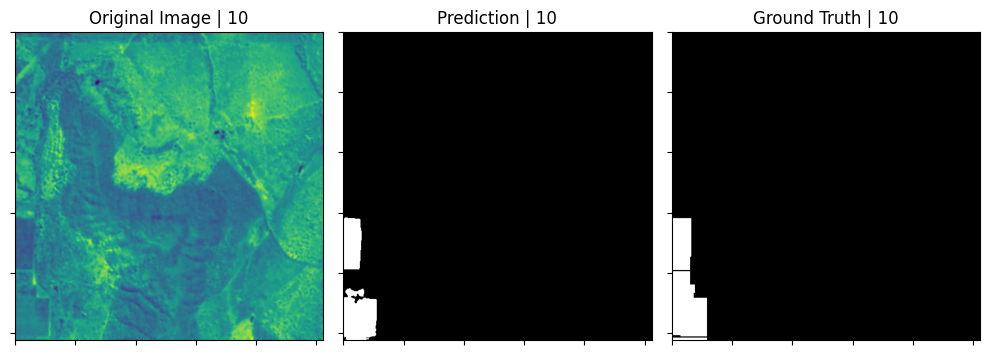

ID: 11 | IoU: 0.737


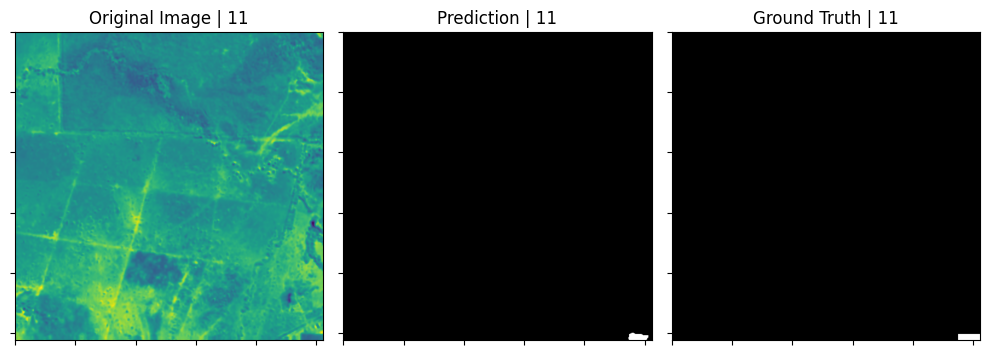

ID: 12 | IoU: 0.955


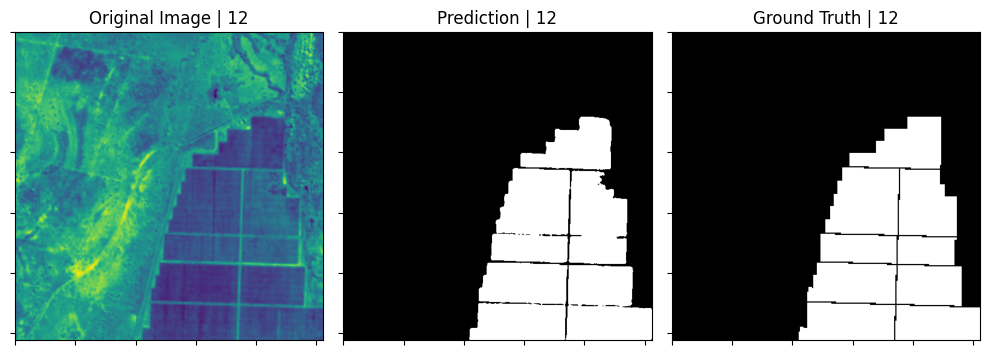

ID: 13 | IoU: 0.905


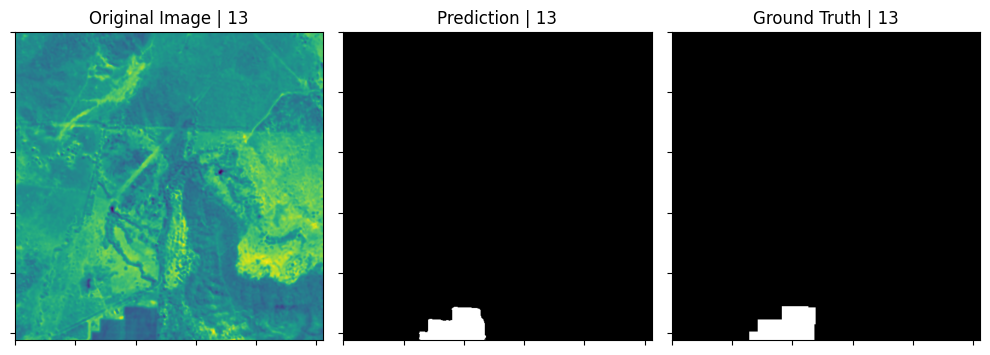

ID: 14 | IoU: 0.972


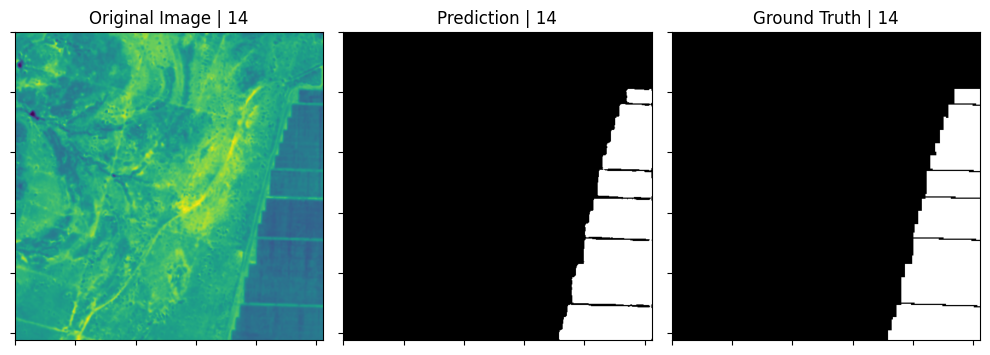

ID: 15 | IoU: 0.0


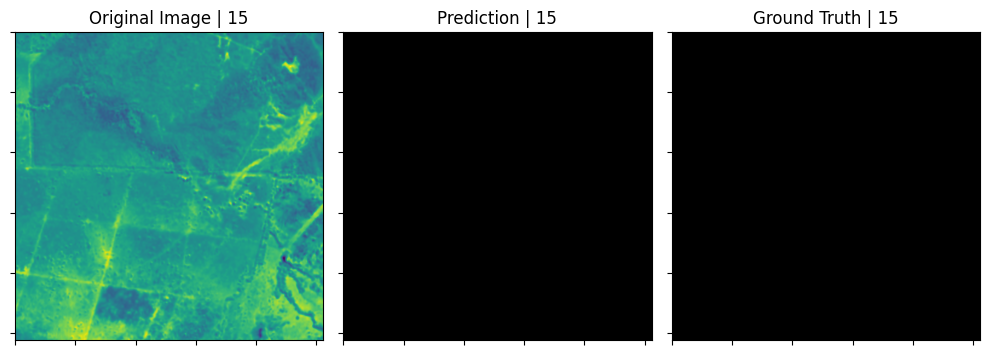

ID: 16 | IoU: 0.926


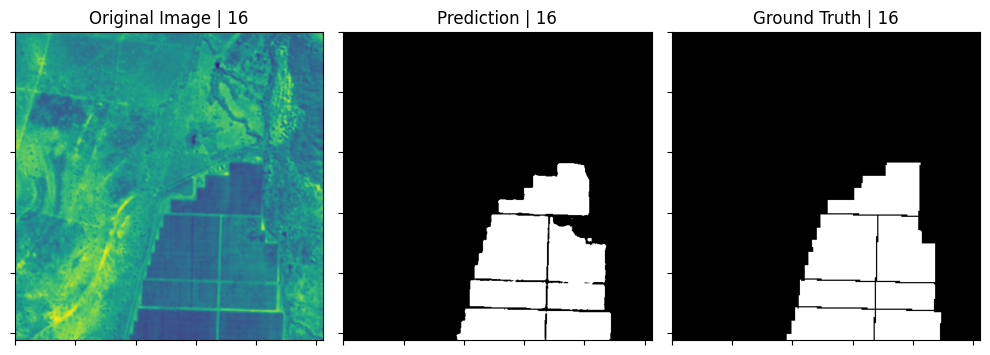

ID: 17 | IoU: 0.717


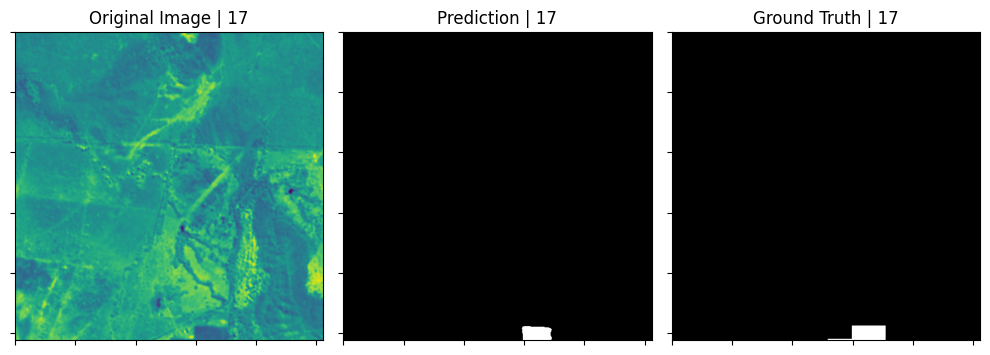

ID: 18 | IoU: 0.86


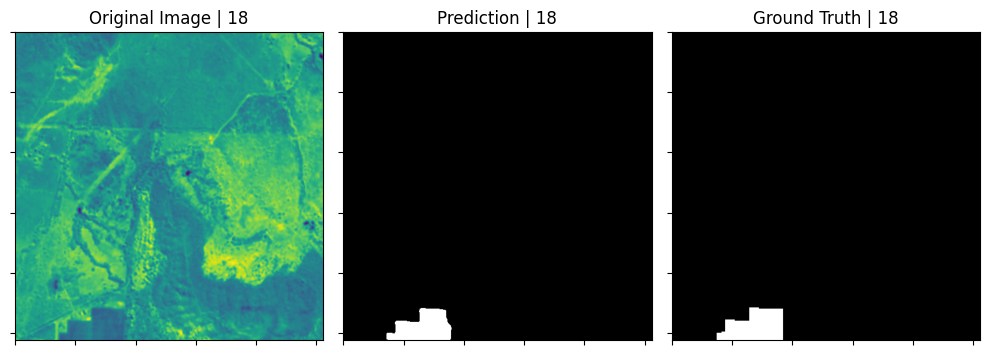

ID: 19 | IoU: 0.955


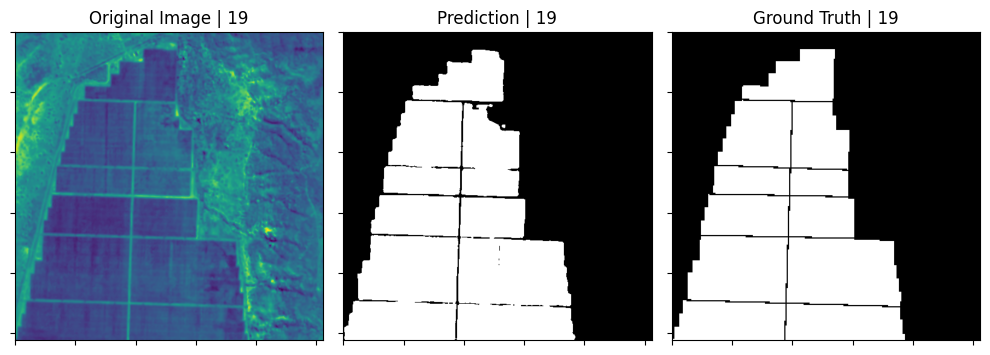

ID: 20 | IoU: 0.0


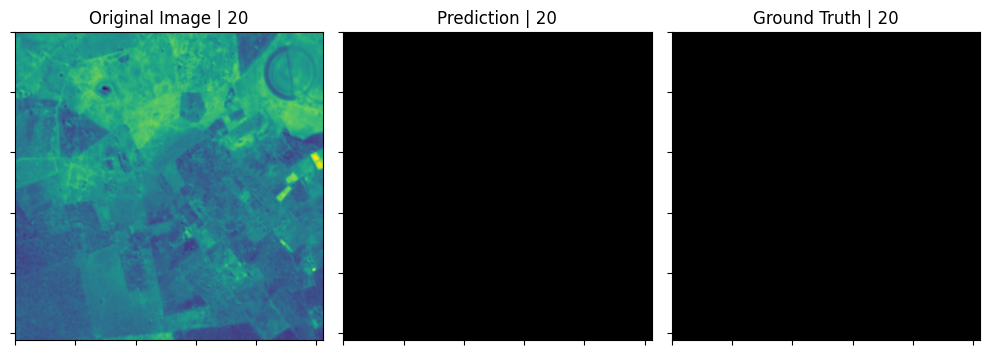

ID: 21 | IoU: 0.638


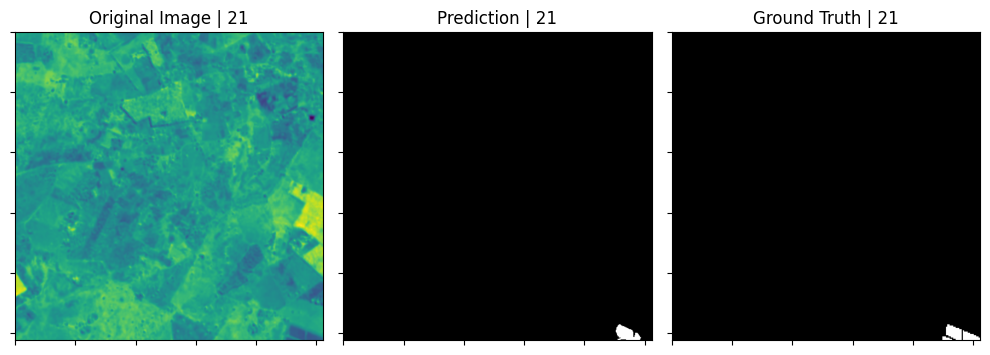

ID: 22 | IoU: 0.871


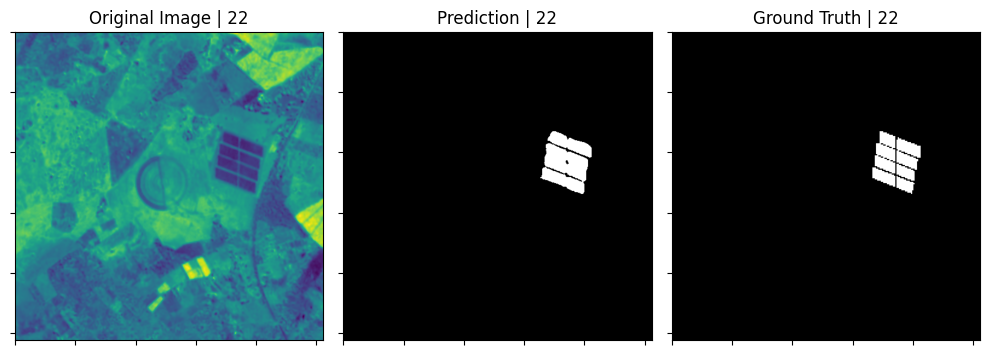

ID: 23 | IoU: 0.861


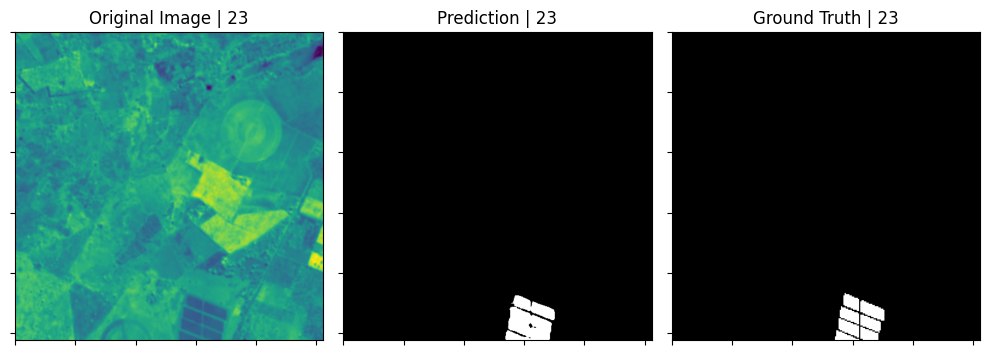

ID: 24 | IoU: 0.86


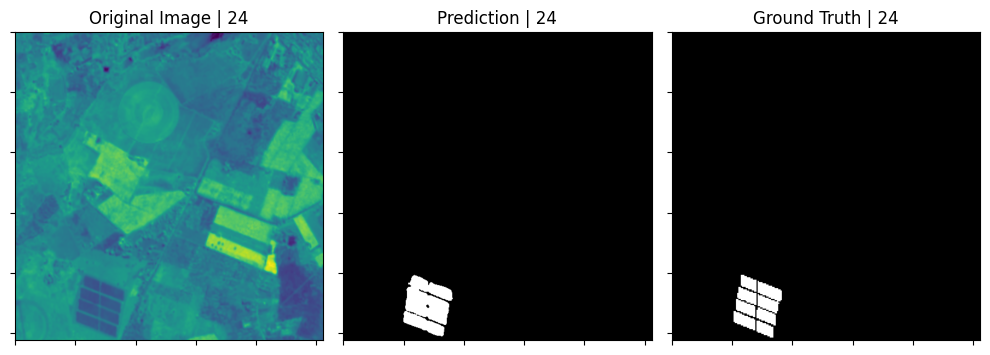

ID: 25 | IoU: 0.868


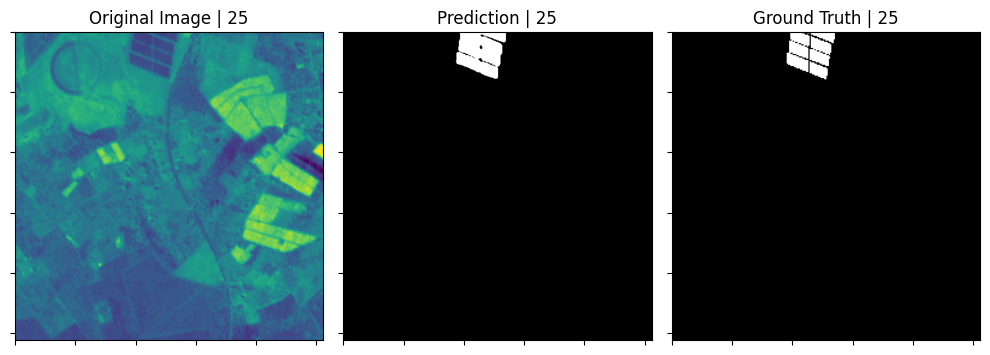

ID: 26 | IoU: 0.784


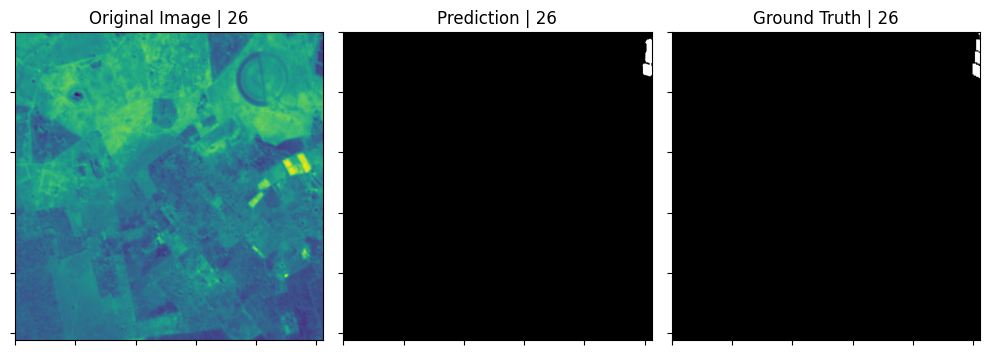

ID: 27 | IoU: 0.859


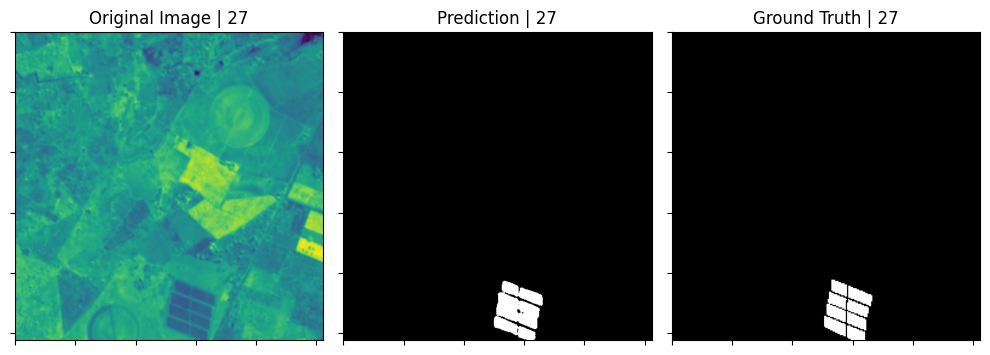

ID: 28 | IoU: 0.855


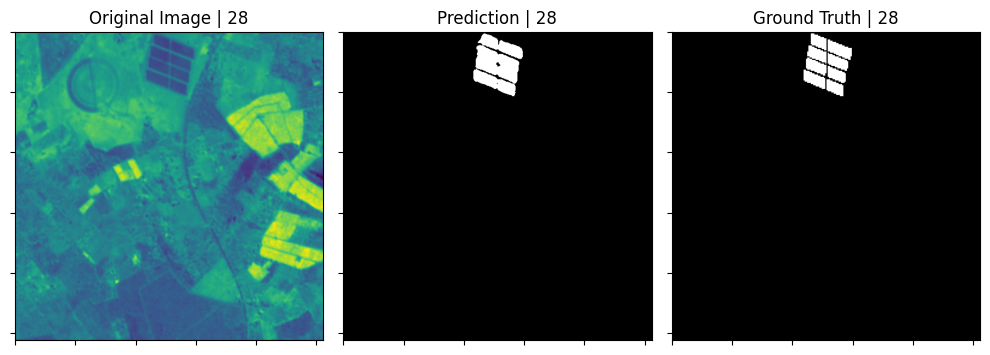

ID: 29 | IoU: 0.855


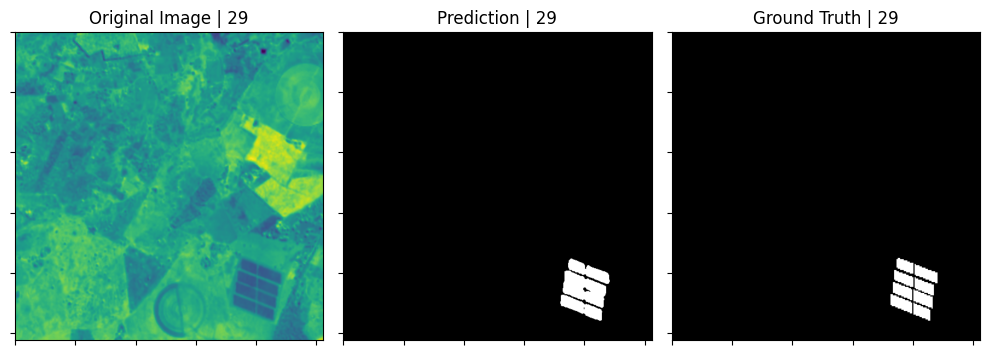

ID: 30 | IoU: 0.8


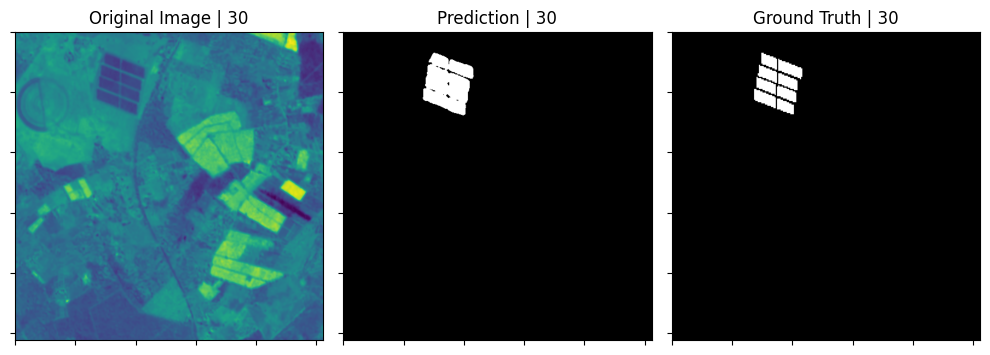

ID: 31 | IoU: 0.852


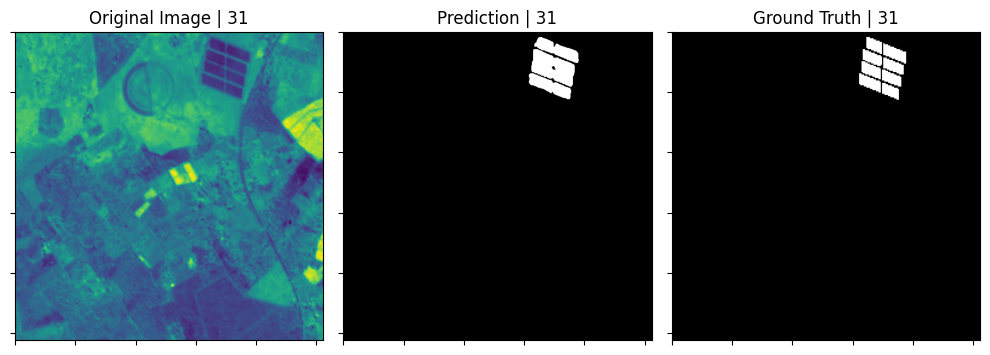

ID: 32 | IoU: 0.804


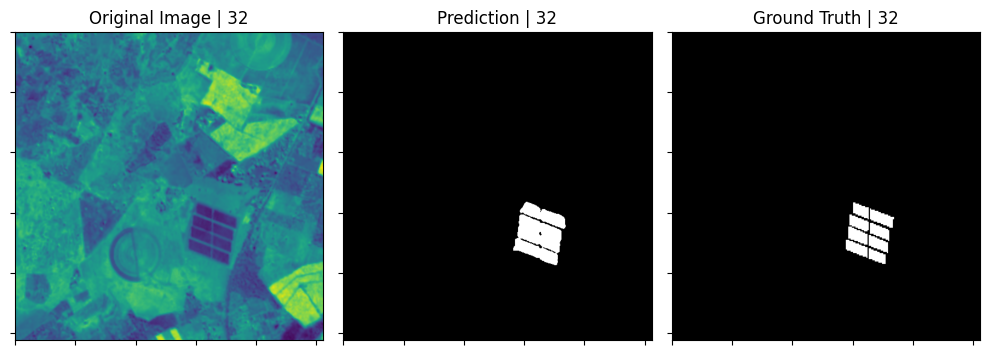

ID: 33 | IoU: 0.0


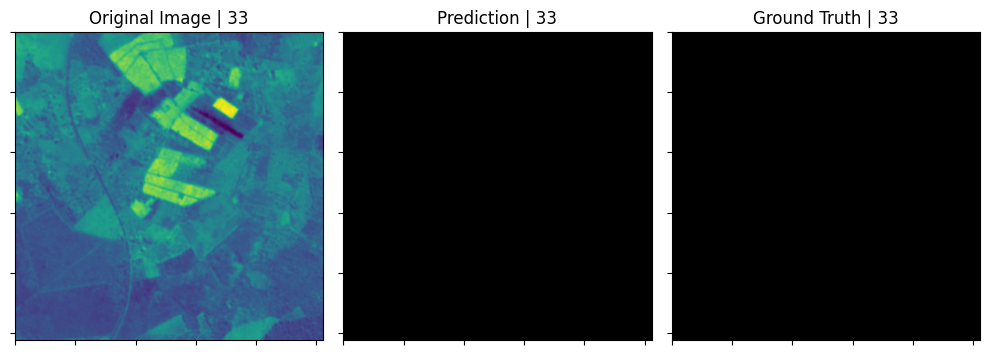

ID: 34 | IoU: 0.864


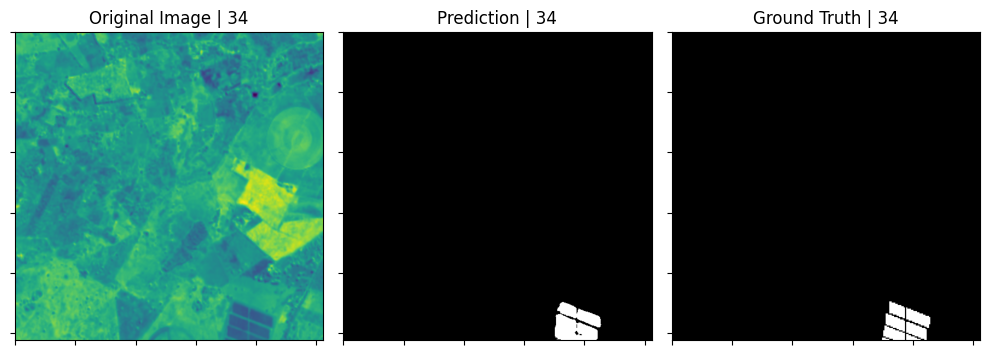

ID: 35 | IoU: 0.869


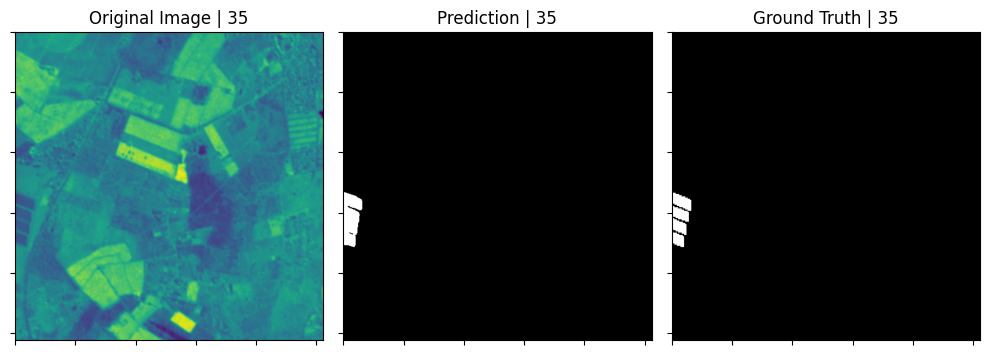

ID: 36 | IoU: 0.834


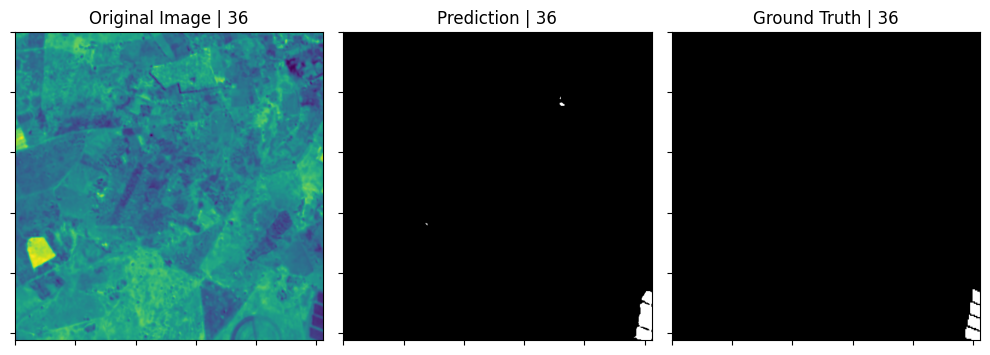

In [70]:
# from sklearn.metrics import jaccard_score
# import matplotlib.pyplot as plt
# import numpy as np
# import torch

# Ensure the output directory is cleared and exists
output_dir = "imgs"

# Clear the output directory if it exists
if os.path.exists(output_dir):
    shutil.rmtree(output_dir)  # Delete all files and the directory
os.makedirs(output_dir, exist_ok=True)  # Create a fresh directory


actual_img_count = 0

with torch.no_grad():
    model.eval()  # Set model to evaluation mode
    
    for data in test_loader:
        inp, lab = data

        inp = inp.to(DEVICE)
        lab = lab.to(DEVICE)
        pred = model(inp) 

        #print(len(inp))
        
        # Loop through the batch
        for i in range(len(inp)):
            iou_score = 0
            
            # Extract and process the ground truth and input image
            lab_unit = lab[i, 0, :, :].cpu().numpy()  # Take single channel for ground truth
            inp_unit = inp[i].cpu().numpy()  # Extract input and move to CPU
            inp_unit = np.transpose(inp_unit[:3], (1, 2, 0))  # Take RGB channels, adjust to HxWxC
            
            # Process prediction and calculate IoU score
            pred_img = pred[i, 0, :, :].cpu().numpy()  # Single channel prediction
            #pred_img = np.where(pred_img > 0.5, 1, 0)  # Threshold to binary
            pred_img = np.where(pred_img > g_threshold, 1, 0)
            
            iou_score = jaccard_score(lab_unit.reshape(-1), pred_img.reshape(-1), zero_division=0)

            # Plot images
            NUM_ROWS = 1
            IMGs_IN_ROW = 3
            f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(10, 10))

            #ax[0].imshow(inp_unit / 3000)  # Adjust scale as needed for input display
            ax[0].imshow((inp_unit - inp_unit.min()) / (inp_unit.max() - inp_unit.min()))  # Normalize for display
            ax[1].imshow(pred_img, cmap='binary_r')
            ax[2].imshow(lab_unit, cmap='binary_r')

            ax[0].set_title(f'Original Image | {actual_img_count + 1}')
            ax[1].set_title(f'Prediction | {actual_img_count + 1}')
            ax[2].set_title(f'Ground Truth | {actual_img_count + 1}')

            # Remove tick labels for a cleaner plot
            for a in ax:
                a.set_yticklabels([])
                a.set_xticklabels([])

            print(f'ID: {actual_img_count + 1} | IoU: {round(iou_score, 3)}')
            plt.tight_layout()
            
            # Save selected images
            if actual_img_count in [15, 22, 29]:
                plt.savefig(f'imgs/img{actual_img_count}.png', dpi=500, bbox_inches='tight', pad_inches=0)
            plt.show()
            
            actual_img_count += 1

In [ ]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns

# def compute_confusion_matrix_with_distributions(model, test_loader, device):
#     """
#     Compute the confusion matrix for all pixels in the test set.
#     Args:
#         model: Trained segmentation model.
#         test_loader: DataLoader for the test set.
#         device: Device ('cuda' or 'cpu').

#     Returns:
#         cm: Confusion matrix (2x2 for binary classification).
#     """
#     model.eval()  # Set model to evaluation mode
#     all_preds = []
#     all_masks = []

#     nb_of_images_eval = 0

#     with torch.no_grad():
#         for images, masks in test_loader:
#             # Ensure we're using only test images
#             assert len(images) > 0, "No images found in test_loader."
            
#             images = images.to(device)
#             masks = masks.to(device)

#             # Get predictions
#             preds = model(images)

#             # Ensure predictions and masks have the same spatial dimensions
#             assert preds.shape == masks.shape, f"Shape mismatch: preds {preds.shape}, masks {masks.shape}"
            
#             # Flatten predictions and masks for confusion matrix computation
#             all_preds.append(preds.cpu().numpy().ravel())
#             all_masks.append(masks.cpu().numpy().ravel())

#             nb_of_images_eval += 1

#     # Concatenate all predictions and masks
#     all_preds = np.concatenate(all_preds)
#     all_masks = np.concatenate(all_masks)

#     # Debug: Check final shapes
#     print(f"Final shapes - all_preds: {all_preds.shape}, all_masks: {all_masks.shape}")
#     assert len(all_preds) == len(all_masks), f"Length mismatch: preds {len(all_preds)}, masks {len(all_masks)}"

#     # Compute confusion matrix
#     binary_preds = (all_preds > 0.5).astype(int)
    
#     cm = confusion_matrix(all_masks, binary_preds, labels=[0, 1])
 
#     # Separate probabilities for positive and negative classes
#     pos_probs = all_preds[all_masks == 1]  # Positive class (PV)
#     neg_probs = all_preds[all_masks == 0]  # Negative class (Background)

#     return cm, pos_probs, neg_probs, nb_of_images_eval


def compute_confusion_matrix_with_distributions(model, test_loader, device):
    """
    Compute the confusion matrix for all pixels in the test set across all batches.
    Args:
        model: Trained segmentation model.
        test_loader: DataLoader for the test set.
        device: Device ('cuda' or 'cpu').

    Returns:
        cm: Confusion matrix (2x2 for binary classification).
        pos_probs: Predicted probabilities for the positive class (PV).
        neg_probs: Predicted probabilities for the negative class (Background).
        nb_of_images_eval: Total number of images evaluated.
    """
    model.eval()  # Set model to evaluation mode
    all_preds = []
    all_masks = []

    nb_of_images_eval = 0

    # Debug: Check the dataset size
    print(f"Test loader dataset size: {len(test_loader.dataset)}")
    print(f"Batch size: {test_loader.batch_size}, Total batches: {len(test_loader)}")

    with torch.no_grad():
        for batch_idx, (images, masks) in enumerate(test_loader):
            # Ensure the batch contains images
            if len(images) == 0:
                print(f"Skipped empty batch {batch_idx + 1}/{len(test_loader)}.")
                continue

            # Debug: Print batch size
            print(f"Processing batch {batch_idx + 1}/{len(test_loader)}: {len(images)} images.")

            # Move images and masks to the device
            images = images.to(device)
            masks = masks.to(device)

            # Get predictions
            preds = model(images)

            # Ensure predictions and masks have consistent shapes
            if preds.shape != masks.shape:
                print(f"Shape mismatch in batch {batch_idx + 1}: preds {preds.shape}, masks {masks.shape}")
                continue  # Skip batch with inconsistent shapes

            # Debug: Print shapes of predictions and masks
            print(f"Batch {batch_idx + 1} shapes - preds: {preds.shape}, masks: {masks.shape}")

            # Flatten predictions and masks for confusion matrix computation
            preds_flat = preds.cpu().numpy().ravel()
            masks_flat = masks.cpu().numpy().ravel()

            # Debug: Print flattened shapes
            print(f"Flattened batch {batch_idx + 1} shapes - preds: {preds_flat.shape}, masks: {masks_flat.shape}")

            # Append the flattened predictions and masks
            all_preds.append(preds_flat)
            all_masks.append(masks_flat)

            nb_of_images_eval += len(images)

    # Concatenate all predictions and masks across all batches
    all_preds = np.concatenate(all_preds)
    all_masks = np.concatenate(all_masks)

    # Debug: Print final concatenated shapes
    print(f"Final concatenated shapes - all_preds: {all_preds.shape}, all_masks: {all_masks.shape}")
    assert len(all_preds) == len(all_masks), (
        f"Length mismatch after processing all batches: preds {len(all_preds)}, masks {len(all_masks)}"
    )

    # Convert probabilities to binary predictions (threshold = 0.5)
    binary_preds = (all_preds > 0.5).astype(int)
    
    # Compute confusion matrix
    cm = confusion_matrix(all_masks, binary_preds, labels=[0, 1])

    # Separate probabilities for positive and negative classes
    pos_probs = all_preds[all_masks == 1]  # Positive class (PV)
    neg_probs = all_preds[all_masks == 0]  # Negative class (Background)

    return cm, pos_probs, neg_probs, nb_of_images_eval



    
def display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval):
    """
    Display the confusion matrix with the traditional layout and print additional metrics.
    Args:
        cm: Confusion matrix (2x2 for binary classification).
    """
    
    # New labels for the classes
    labels = ["Background", "PV"]

    # Extract values from confusion matrix
    TN = cm[0, 0]  # True Negative
    FP = cm[0, 1]  # False Positive
    FN = cm[1, 0]  # False Negative
    TP = cm[1, 1]  # True Positive

    # Calculate metrics
    accuracy = (TP + TN) / (TP + TN + FP + FN)
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0  # Sensitivity (Recall)
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0  # True Negative Rate
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0  # Positive Predictive Value
    f1_score = (2 * precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    IoU = TP / (TP + FN + FP) if (TP + FN + FP) > 0 else 0  # IoU

    # Print metrics
    print(70*'-')
    print(f"TP:{TP}\tTN:{TN}\tFP:{FP}\t\tFN:{FN}")
    print(70*'-')
    print("\n")
    print(f"Accuracy:     {accuracy:.4f}\t               (TP + TN) / (TP + TN + FP + FN)")
    print(f"Recall:       {recall:.4f}\t                      TP / (TP + FN)")
    print(f"Specificity:  {specificity:.4f}\t                      TN / (TN + FP)")
    print(f"Precision:    {precision:.4f}\t                      TP / (TP + FP)")
    print(f"F1-Score:     {f1_score:.4f}\t    (2*precision*recall) / (precision + recall)")
    print(f"IoU:          {IoU:.4f}\t                      TP / (TP + FN + FP)")
    print("\n\n")
    
    # Display the confusion matrix
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))

    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=labels)
    disp.plot(cmap=plt.cm.Blues, ax=axes[0], colorbar=False)
    axes[0].set_title("Confusion Matrix")
    axes[0].set_xlabel("Predicted label")
    axes[0].set_ylabel("True label")

    # Plot distributions of predicted probabilities
    sns.kdeplot(neg_probs, fill=True, color="green", alpha=0.5, label="Negative (Background)", ax=axes[1])
    sns.kdeplot(pos_probs, fill=True, color="blue", alpha=0.5, label="Positive (PV)", ax=axes[1])
    
    # Add a threshold line
    axes[1].axvline(0.5, color="black", linestyle="--", label="Threshold")
    
    # Set titles and labels
    axes[1].set_title("Predicted Probability Distributions")
    axes[1].set_xlabel("Predicted Probability")
    axes[1].set_ylabel("Density")
    
    # Add legend
    axes[1].legend()


# 
cm, pos_probs, neg_probs, nb_of_images_eval = compute_confusion_matrix_with_distributions(model, test_loader, DEVICE)
display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval)

In [ ]:
cm, pos_probs, neg_probs, nb_of_images_eval = compute_confusion_matrix_with_distributions(model, valid_loader, DEVICE)
display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval)

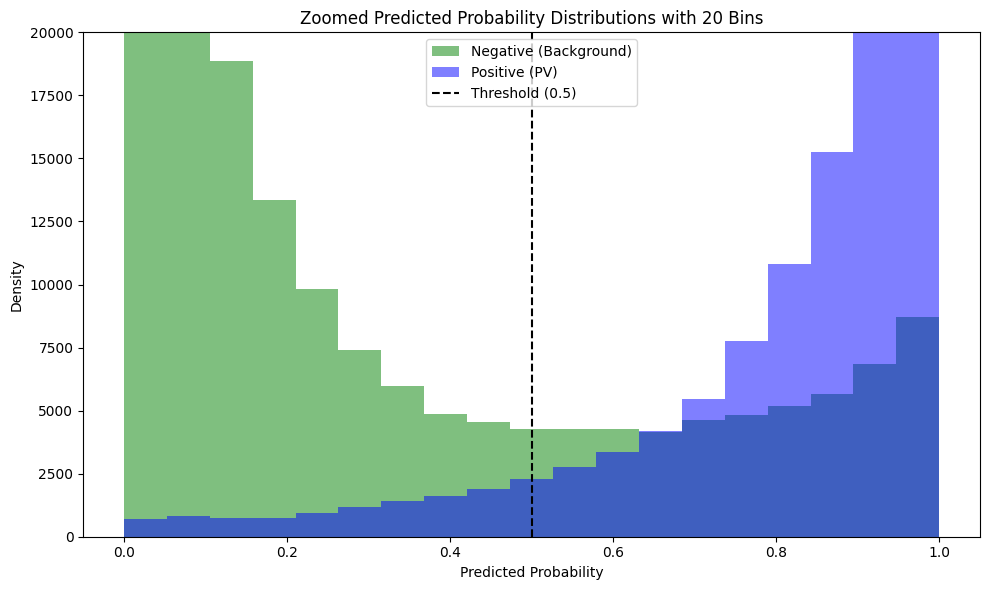

In [79]:

import matplotlib.pyplot as plt

def plot_probability_distribution_zoom(pos_probs, neg_probs, zoom_ylim=(0, 5), threshold=0.5, bins=200):
    """
    Plot the predicted probability distributions with a zoomed-in y-axis using histograms with more bins.
    Args:
        pos_probs: Predicted probabilities for the positive class (PV).
        neg_probs: Predicted probabilities for the negative class (Background).
        zoom_ylim: Tuple for y-axis limits (default is (0, 5)).
        threshold: Threshold value to separate classes (default is 0.5).
        bins: Number of bins for the histogram (default is 100).
    """
    plt.figure(figsize=(10, 6))

    # Define bin edges to ensure alignment of histograms
    bin_edges = np.linspace(0, 1, bins)

    # Plot negative probabilities
    plt.hist(neg_probs, bins=bin_edges, color="green", alpha=0.5, label="Negative (Background)", density=False)

    # Plot positive probabilities
    plt.hist(pos_probs, bins=bin_edges, color="blue", alpha=0.5, label="Positive (PV)", density=False)

    # Add a threshold line
    plt.axvline(threshold, color="black", linestyle="--", label=f"Threshold ({threshold})")

    # Set titles and labels
    plt.title(f"Zoomed Predicted Probability Distributions with {bins} Bins")
    plt.xlabel("Predicted Probability")
    plt.ylabel("Density")
    plt.ylim(zoom_ylim)  # Adjust the y-axis limits to zoom in
    plt.legend()

    # Show the plot
    plt.tight_layout()
    plt.show()


plot_probability_distribution_zoom(pos_probs, neg_probs, zoom_ylim=(0, 20000), bins=20)


In [81]:
import numpy as np
from sklearn.metrics import accuracy_score, jaccard_score, f1_score

# Flatten the labels and predictions for metric computation
lbl = lab.cpu().numpy().reshape(-1)  # Convert the ground truth mask to a 1D array
target = pred.cpu().numpy().reshape(-1)  # Convert the predicted mask to a 1D array

# Check value distributions in lbl and target
#print(f"Label distribution: {np.unique(lbl, return_counts=True)}")
#print(f"Prediction distribution: {np.unique(target, return_counts=True)}")

# Convert predictions to binary format at two different thresholds


target_1 = 0.45
target_2 = 0.46
target_3 = 0.47

threshold_1 = np.where(target > target_1, 1, 0)
threshold_2 = np.where(target > target_2, 1, 0)
threshold_3 = np.where(target > target_3, 1, 0)

# Ensure ground truth is binary
lbl = np.where(lbl > 0.5, 1, 0)

def compute_metrics(label, target_25, target_50, target_75):
    # Compute accuracy at different thresholds
    acc_25 = accuracy_score(label, target_25)
    acc_50 = accuracy_score(label, target_50)
    acc_75 = accuracy_score(label, target_75)
    
    # Compute IoU (Jaccard score) at different thresholds
    iou_25 = jaccard_score(label, target_25)
    iou_50 = jaccard_score(label, target_50)
    iou_75 = jaccard_score(label, target_75)
    
    # Compute F1-score at different thresholds
    f_25 = f1_score(label, target_25)
    f_50 = f1_score(label, target_50)
    f_75 = f1_score(label, target_75)
    
    # Display results
    print(f'Thresholds: \t {100*target_1:.2f}%\t|{100*target_2:.2f}%\t|{100*target_3:.2f}%')
    print(40*'-')
    print('Accuracy:\t', round(acc_25 * 100, 2), '|', round(acc_50 * 100, 2), '|', round(acc_75 * 100, 2))
    print('IoU:\t\t', round(iou_25 * 100, 2), '|', round(iou_50 * 100, 2), '|', round(iou_75 * 100, 2))
    print('F-score:\t', round(f_25 * 100, 2), '|', round(f_50 * 100, 2), '|', round(f_75 * 100, 2))

# Compute and display the metrics
compute_metrics(lbl, threshold_1, threshold_2, threshold_3)

Thresholds: 	 45.00%	|46.00%	|47.00%
----------------------------------------
Accuracy:	 99.79 | 99.8 | 99.8
IoU:		 82.98 | 83.21 | 83.39
F-score:	 90.7 | 90.84 | 90.94


In [ ]:
plot_probability_distribution_zoom(pos_probs, neg_probs, zoom_ylim=(0, 2), threshold=.45)

In [85]:
pred.shape


torch.Size([6, 1, 512, 512])

In [87]:
lab.shape

torch.Size([6, 1, 512, 512])

## Let's work on the pixels and understand FN and FP

In [ ]:
actual_img_count = 0

with torch.no_grad():
    model.eval()  # Set model to evaluation mode

    data = next(iter(valid_loader))

    inp, lab = data
    
    inp = inp.to(DEVICE)
    lab = lab.to(DEVICE)
    pred = model(inp) 

    i = 0
    lab_unit = lab[i, 0, :, :].cpu().numpy()
    inp_unit = inp[i].cpu().numpy()
    inp_unit = np.transpose(inp_unit[:3], (1, 2, 0))

    pred_img = pred[i, 0, :, :].cpu().numpy()
    pred_img = np.where(pred_img > 0.5, 1, 0)  # Threshold to binary
    
    #print(pred_img.shape)
    #print(pred_img[100,100])

    #print(len(inp))

    # Count positive and negative pixels in prediction and ground truth
    pred_positive = np.sum(pred_img == 1)
    pred_negative = np.sum(pred_img == 0)
    lab_positive = np.sum(lab_unit == 1)
    lab_negative = np.sum(lab_unit == 0)

    # Print shapes and pixel counts
    print(f"Prediction Shape: {pred_img.shape}")
    print(f"Prediction Positive Pixels (1): {pred_positive}")
    print(f"Prediction Negative Pixels (0): {pred_negative}")
    print(f"Ground Truth Positive Pixels (1): {lab_positive}")
    print(f"Ground Truth Negative Pixels (0): {lab_negative}")
    #print(f"Batch Size: {len(inp)}")

    # Calculate TP, TN, FP, FN
    TP = np.sum((pred_img == 1) & (lab_unit == 1))  # True Positives
    TN = np.sum((pred_img == 0) & (lab_unit == 0))  # True Negatives
    FP = np.sum((pred_img == 1) & (lab_unit == 0))  # False Positives
    FN = np.sum((pred_img == 0) & (lab_unit == 1))  # False Negatives
    
    # Calculate metrics
    accuracy = (TP + TN) / (TP + TN + FP + FN) if (TP + TN + FP + FN) > 0 else 0
    recall = TP / (TP + FN) if (TP + FN) > 0 else 0  # Sensitivity
    specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
    precision = TP / (TP + FP) if (TP + FP) > 0 else 0
    f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
    iou = TP / (TP + FP + FN) if (TP + FP + FN) > 0 else 0
    
    # Print results
    print("\nConfusion Matrix:")
    print(f"TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}\n")
    
    print("Metrics:")
    print(f"Accuracy: \t\t{accuracy:.4f}")
    print(f"Recall (Sensitivity): \t{recall:.4f}")
    print(f"Specificity: \t\t{specificity:.4f}")
    print(f"Precision: \t\t{precision:.4f}")
    print(f"F1-Score: \t\t{f1_score:.4f}")
    print(f"IoU: \t\t\t{iou:.4f}")


    # Plot images
    NUM_ROWS = 1
    IMGs_IN_ROW = 3
    f, ax = plt.subplots(NUM_ROWS, IMGs_IN_ROW, figsize=(10, 10))

    ax[0].imshow((inp_unit - inp_unit.min()) / (inp_unit.max() - inp_unit.min()))  # Normalize for display
    ax[1].imshow(pred_img, cmap='binary_r')
    ax[2].imshow(lab_unit, cmap='binary_r')

    ax[0].set_title(f'Original Image | {actual_img_count + 1}')
    ax[1].set_title(f'Prediction | {actual_img_count + 1}')
    ax[2].set_title(f'Ground Truth | {actual_img_count + 1}')

    # Remove tick labels for a cleaner plot
    for a in ax:
        a.set_yticklabels([])
        a.set_xticklabels([])

    #print(f'ID: {actual_img_count + 1} | IoU: {round(iou_score, 3)}')
    
    # Save selected images
    #if actual_img_count in [15, 22, 29]:
    #    plt.savefig(f'imgs/img{actual_img_count}.png', dpi=500, bbox_inches='tight', pad_inches=0)
    
    plt.tight_layout()
    plt.show()




In [91]:
# Get the dimensions of the images
height, width = pred_img.shape

# Get corner pixel values for prediction
pred_upper_left = pred_img[0, 0]
pred_upper_right = pred_img[0, width - 1]
pred_bottom_left = pred_img[height - 1, 0]
pred_bottom_right = pred_img[height - 1, width - 1]

# Get corner pixel values for ground truth
lab_upper_left = lab_unit[0, 0]
lab_upper_right = lab_unit[0, width - 1]
lab_bottom_left = lab_unit[height - 1, 0]
lab_bottom_right = lab_unit[height - 1, width - 1]

# Print corner pixel values
print("Prediction Corner Pixels:")
print(f"Upper Left: {pred_upper_left}, Upper Right: {pred_upper_right}")
print(f"Bottom Left: {pred_bottom_left}, Bottom Right: {pred_bottom_right}")

print("\nGround Truth Corner Pixels:")
print(f"Upper Left: {lab_upper_left}, Upper Right: {lab_upper_right}")
print(f"Bottom Left: {lab_bottom_left}, Bottom Right: {lab_bottom_right}")

Prediction Corner Pixels:
Upper Left: 0, Upper Right: 0
Bottom Left: 0, Bottom Right: 0

Ground Truth Corner Pixels:
Upper Left: 1.0, Upper Right: 0.0
Bottom Left: 0.0, Bottom Right: 0.0


In [92]:
def print_errors_on_predictions_by_set(loader):
    with torch.no_grad():
        model.eval()  # Set model to evaluation mode

        log = []  # Overall log for all batches
        total_non_blank_masks = 0
        total_avg_iou = 0

        # Loop through all batches in the DataLoader
        for batch_idx, (inp, lab) in enumerate(loader):
            inp = inp.to(DEVICE)
            lab = lab.to(DEVICE)
            pred = model(inp)

            batch_size = inp.size(0)  # Number of images in the batch

            # Loop through all images in the batch
            for i in range(batch_size):
                img_log = {}

                lab_unit = lab[i, 0, :, :].cpu().numpy()  # Ground truth
                inp_unit = inp[i].cpu().numpy()  # Input image
                inp_unit = np.transpose(inp_unit[:3], (1, 2, 0))  # Adjust to HxWxC for RGB channels

                pred_img = pred[i, 0, :, :].cpu().numpy()  # Prediction
                pred_img = np.where(pred_img > 0.5, 1, 0)  # Threshold to binary

                # Count TP, TN, FP, FN
                TP = np.sum((pred_img == 1) & (lab_unit == 1))
                TN = np.sum((pred_img == 0) & (lab_unit == 0))
                FP = np.sum((pred_img == 1) & (lab_unit == 0))
                FN = np.sum((pred_img == 0) & (lab_unit == 1))

                # Initialize the log dictionary
                img_log["TP"] = TP
                img_log["TN"] = TN
                img_log["FP"] = FP
                img_log["FN"] = FN

                img_log["pred_positive"] = np.sum(pred_img == 1)
                img_log["pred_negative"] = np.sum(pred_img == 0)
                img_log["lab_positive"] = np.sum(lab_unit == 1)
                img_log["lab_negative"] = np.sum(lab_unit == 0)

                # Calculate metrics
                accuracy = (TP + TN) / (TP + TN + FP + FN) if (TP + TN + FP + FN) > 0 else 0
                recall = TP / (TP + FN) if (TP + FN) > 0 else 0  # Sensitivity
                specificity = TN / (TN + FP) if (TN + FP) > 0 else 0
                precision = TP / (TP + FP) if (TP + FP) > 0 else 0
                f1_score = 2 * (precision * recall) / (precision + recall) if (precision + recall) > 0 else 0
                iou = TP / (TP + FP + FN) if (TP + FP + FN) > 0 else 0

                img_log["accuracy"] = accuracy
                img_log["recall"] = recall
                img_log["specificity"] = specificity
                img_log["precision"] = precision
                img_log["f1_score"] = f1_score
                img_log["iou"] = iou

                log.append(img_log)

                # Print results for each image
                print(f"\nBatch {batch_idx + 1}, Image {i + 1}/{batch_size}")
                print("Confusion Matrix:")
                print(f"TP: {TP}, TN: {TN}, FP: {FP}, FN: {FN}")
                print("Metrics:")
                print(f"Accuracy: \t\t{accuracy:.4f}")
                print(f"Recall (Sensitivity): \t{recall:.4f}")
                print(f"Specificity: \t\t{specificity:.4f}")
                print(f"Precision: \t\t{precision:.4f}")
                print(f"F1-Score: \t\t{f1_score:.4f}")
                print(f"IoU: \t\t\t{iou:.4f}")

                # Create an overlay with FP (yellow) and FN (green)
                overlay = np.zeros((*pred_img.shape, 3), dtype=np.float32)  # Create a blank RGB image

                # Assign colors for FP and FN
                overlay[(pred_img == 1) & (lab_unit == 0)] = [1, 1, 0]  # Yellow for FP
                overlay[(pred_img == 0) & (lab_unit == 1)] = [0, 1, 0]  # Green for FN

                # Combine the overlay with a black-and-white version of the prediction
                highlighted_pred = overlay  # Use the overlay directly for colored visualization

                # Plot images for the current image in the batch
                fig = plt.figure(figsize=(12, 15))  # Set overall figure size

                # First row: Original image, Prediction, Ground Truth
                ax1 = fig.add_subplot(2, 3, 1)
                ax1.imshow((inp_unit - inp_unit.min()) / (inp_unit.max() - inp_unit.min()))  # Normalize for display
                ax1.set_title(f'Original Image | {i + 1}')
                ax1.axis('off')

                ax2 = fig.add_subplot(2, 3, 2)
                ax2.imshow(pred_img, cmap='binary_r')
                ax2.set_title(f'Prediction | {i + 1}')
                ax2.axis('off')

                ax3 = fig.add_subplot(2, 3, 3)
                ax3.imshow(lab_unit, cmap='binary_r')
                ax3.set_title(f'Ground Truth | {i + 1}')
                ax3.axis('off')

                # Second row: Larger Prediction with FP and FN highlights
                ax4 = fig.add_subplot(2, 1, 2)  # Spanning the entire width of the second row
                ax4.imshow(highlighted_pred)
                ax4.set_title(f'Prediction with FP (Yellow) & FN (Green) | {i + 1}')
                ax4.axis('off')

                plt.tight_layout()
                plt.show()

                # Update IoU calculation for non-blank masks
                if img_log["lab_positive"] != 0:
                    total_non_blank_masks += 1
                    total_avg_iou += img_log["iou"]

        # Final summary
        print('\n\nimage:\tP+\tP-\tM+\tM-\tTP\tTN\tFP\tFN\tacc\trec\tspec\tprec\tf1_s\tiou')
        for j, img_log in enumerate(log):
            print(
                f" {j+1} \t{img_log['pred_positive']}\t{img_log['pred_negative']}\t{img_log['lab_positive']}\t{img_log['lab_negative']}"
                f"\t{img_log['TP']}\t{img_log['TN']}\t{img_log['FP']}\t{img_log['FN']}\t{img_log['accuracy']:.3f} "
                f"\t{img_log['recall']:.3f}\t{img_log['specificity']:.3f}\t{img_log['precision']:.3f}"
                f"\t{img_log['f1_score']:.3f}\t{img_log['iou']:.3f}"
            )

        print(f'\nNb of non-blank masks: {total_non_blank_masks}, avg_iou: {(total_avg_iou / total_non_blank_masks):.6f}')

            


In [ ]:
print_errors_on_predictions_by_set(valid_loader)

In [ ]:
print_errors_on_predictions_by_set(test_loader)

In [ ]:
print_errors_on_predictions_by_set(train_loader)

In [ ]:
cm, pos_probs, neg_probs, nb_of_images_eval = compute_confusion_matrix_with_distributions(model, train_loader, DEVICE)
display_confusion_matrix_with_metrics_and_distributions(cm, pos_probs, neg_probs, nb_of_images_eval)